# Installing packages

In [1]:
!pip install -U ndlib loguru kaleido

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 37.4 MB/s eta 0:00:00
  Attempting uninstall: loguru
    Found existing installation: loguru 0.5.3
    Uninstalling loguru-0.5.3:
      Successfully uninstalled loguru-0.5.3


# Kernelized kNN search

In [2]:
"""
A JAX-based implementation for efficient k-nearest neighbors.
"""

from functools import partial
import jax
import jax.numpy as jnp


class HPIndex:

    """
    A kernelized kNN index that uses batching / tiling to efficiently handle
    large datasets with limited memory usage.
    """

    def __init__(self):
        pass

    @staticmethod
    def knn_tiled(x, y, k=5, x_tile_size=8192, y_batch_size=1024):
        """
        Advanced implementation that tiles both database and query points.
        This wrapper handles the dynamic aspects before calling the JIT-compiled
        function.

        Args:
            x: (n, d) array of database points
            y: (m, d) array of query points
            k: number of nearest neighbors
            x_tile_size: size of database tiles
            y_batch_size: size of query batches

        Returns:
            (m, k) array of indices of nearest neighbors
        """
        n_x, _ = x.shape
        n_y, _ = y.shape

        # Ensure batch sizes aren't larger than the data dimensions
        x_tile_size = min(x_tile_size, n_x)
        y_batch_size = min(y_batch_size, n_y)

        # Calculate batching parameters
        num_y_batches = n_y // y_batch_size
        y_remainder = n_y % y_batch_size
        num_x_tiles = (n_x + x_tile_size - 1) // x_tile_size

        # Call the JIT-compiled implementation with concrete values
        return HPIndex._knn_tiled_jit(
            x, y, k, x_tile_size, y_batch_size,
            num_y_batches, y_remainder, num_x_tiles, n_x
        )

    @staticmethod
    @partial(jax.jit, static_argnums=(2, 3, 4, 5, 6, 7, 8))
    def _knn_tiled_jit(x, y, k, x_tile_size, y_batch_size,
                       num_y_batches, y_remainder, num_x_tiles, n_x):
        """
        JIT-compiled implementation of tiled KNN with concrete batch parameters.
        """
        n_y, d_y = y.shape
        _, d_x = x.shape

        # Initialize results
        all_indices = jnp.zeros((n_y, k), dtype=jnp.int32)
        all_distances = jnp.ones((n_y, k)) * jnp.finfo(jnp.float32).max

        # Define the scan function for processing y batches
        def process_y_batch(carry, y_batch_idx):
            curr_indices, curr_distances = carry

            # Get current batch of query points
            y_start = y_batch_idx * y_batch_size
            y_batch = jax.lax.dynamic_slice(y, (y_start, 0), (y_batch_size, d_y))

            # Initialize batch results
            batch_indices = jnp.zeros((y_batch_size, k), dtype=jnp.int32)
            batch_distances = jnp.ones((y_batch_size, k)) * jnp.finfo(jnp.float32).max

            # Define the scan function for processing x tiles within a y batch
            def process_x_tile(carry, x_tile_idx):
                batch_idx, batch_dist = carry

                # Get current tile of database points - use fixed size slices
                x_start = x_tile_idx * x_tile_size

                # Use a fixed size for the slice and then mask invalid values
                x_tile = jax.lax.dynamic_slice(
                    x, (x_start, 0), (x_tile_size, d_x)
                )

                # Calculate how many elements are actually valid
                # (This is now done without dynamic shapes)
                x_tile_actual_size = jnp.minimum(x_tile_size, n_x - x_start)

                # Compute distances between y_batch and x_tile
                tile_distances = _compute_batch_distances(y_batch, x_tile)

                # Mask out invalid indices (those beyond the actual data)
                valid_mask = jnp.arange(x_tile_size) < x_tile_actual_size
                tile_distances = jnp.where(
                    valid_mask[jnp.newaxis, :],
                    tile_distances,
                    jnp.ones_like(tile_distances) * jnp.finfo(jnp.float32).max
                )

                # Adjust indices to account for tile offset
                # Make sure indices are within bounds
                tile_indices = jnp.minimum(
                    jnp.arange(x_tile_size) + x_start,
                    n_x - 1  # Ensure indices don't go beyond n_x
                )
                tile_indices = jnp.broadcast_to(tile_indices, tile_distances.shape)

                # Merge current tile results with previous results
                combined_distances = jnp.concatenate([batch_dist, tile_distances], axis=1)
                combined_indices = jnp.concatenate([batch_idx, tile_indices], axis=1)

                # Sort and get top k
                top_k_idx = jnp.argsort(combined_distances)[:, :k]

                # Gather top k distances and indices
                new_batch_dist = jnp.take_along_axis(combined_distances, top_k_idx, axis=1)
                new_batch_idx = jnp.take_along_axis(combined_indices, top_k_idx, axis=1)

                return (new_batch_idx, new_batch_dist), None

            # Process all x tiles for this y batch
            (batch_indices, batch_distances), _ = jax.lax.scan(
                process_x_tile,
                (batch_indices, batch_distances),
                jnp.arange(num_x_tiles)
            )

            # Update overall results for this batch
            curr_indices = jax.lax.dynamic_update_slice(
                curr_indices, batch_indices, (y_start, 0)
            )
            curr_distances = jax.lax.dynamic_update_slice(
                curr_distances, batch_distances, (y_start, 0)
            )

            return (curr_indices, curr_distances), None

        # Process all full y batches
        (all_indices, all_distances), _ = jax.lax.scan(
            process_y_batch,
            (all_indices, all_distances),
            jnp.arange(num_y_batches)
        )

        # Handle y remainder with similar changes if needed
        def handle_y_remainder(indices, distances):
            y_start = num_y_batches * y_batch_size

            # Get and pad remainder batch
            remainder_y = jax.lax.dynamic_slice(y, (y_start, 0), (y_remainder, d_y))
            padded_y = jnp.pad(remainder_y, ((0, y_batch_size - y_remainder), (0, 0)))

            # Initialize remainder results
            remainder_indices = jnp.zeros((y_batch_size, k), dtype=jnp.int32)
            remainder_distances = jnp.ones((y_batch_size, k)) * jnp.finfo(jnp.float32).max

            # Process x tiles for the remainder batch (with same fix as above)
            def process_x_tile_remainder(carry, x_tile_idx):
                batch_idx, batch_dist = carry

                # Get current tile of database points - use fixed size slices
                x_start = x_tile_idx * x_tile_size

                # Use fixed size for the slice
                x_tile = jax.lax.dynamic_slice(
                    x, (x_start, 0), (x_tile_size, d_x)
                )

                # Calculate actual valid size
                x_tile_actual_size = jnp.minimum(x_tile_size, n_x - x_start)

                # Compute distances between padded_y and x_tile
                tile_distances = _compute_batch_distances(padded_y, x_tile)

                # Mask out invalid indices (both for y padding and x overflow)
                x_valid_mask = jnp.arange(x_tile_size) < x_tile_actual_size
                tile_distances = jnp.where(
                    x_valid_mask[jnp.newaxis, :],
                    tile_distances,
                    jnp.ones_like(tile_distances) * jnp.finfo(jnp.float32).max
                )

                # Adjust indices to account for tile offset
                tile_indices = jnp.minimum(
                    jnp.arange(x_tile_size) + x_start,
                    n_x - 1  # Ensure indices don't go beyond n_x
                )
                tile_indices = jnp.broadcast_to(tile_indices, tile_distances.shape)

                # Merge current tile results with previous results
                combined_distances = jnp.concatenate([batch_dist, tile_distances], axis=1)
                combined_indices = jnp.concatenate([batch_idx, tile_indices], axis=1)

                # Sort and get top k
                top_k_idx = jnp.argsort(combined_distances)[:, :k]

                # Gather top k distances and indices
                new_batch_dist = jnp.take_along_axis(combined_distances, top_k_idx, axis=1)
                new_batch_idx = jnp.take_along_axis(combined_indices, top_k_idx, axis=1)

                return (new_batch_idx, new_batch_dist), None

            # Process all x tiles for the remainder batch
            (remainder_indices, remainder_distances), _ = jax.lax.scan(
                process_x_tile_remainder,
                (remainder_indices, remainder_distances),
                jnp.arange(num_x_tiles)
            )

            # Extract valid remainder results and update
            valid_remainder_indices = remainder_indices[:y_remainder]

            indices = jax.lax.dynamic_update_slice(
                indices, valid_remainder_indices, (y_start, 0)
            )

            return indices, distances

        # Conditionally handle remainder to avoid issues with remainder=0
        all_indices, all_distances = jax.lax.cond(
            y_remainder > 0,
            lambda args: handle_y_remainder(*args),
            lambda args: args,
            (all_indices, all_distances)
        )

        return all_indices, all_distances


# Globally define the _compute_batch_distances function for reuse
@jax.jit
def _compute_batch_distances(y_batch, x):
    """
    Compute the squared distances between a batch of query points and all
    database points.

    Args:
        y_batch: (batch_size, d) array of query points
        x: (n, d) array of database points

    Returns:
        (batch_size, n) array of squared distances
    """
    # Compute squared norms
    x_norm = jnp.sum(x**2, axis=1)
    y_norm = jnp.sum(y_batch**2, axis=1)

    # Compute xy term
    xy = jnp.dot(y_batch, x.T)

    # Complete squared distance: ||y||² + ||x||² - 2*<y,x>
    dists2 = y_norm[:, jnp.newaxis] + x_norm[jnp.newaxis, :] - 2 * xy
    dists2 = jnp.clip(dists2, 0, jnp.finfo(jnp.float32).max)

    return dists2

# Graph Embedding

In [3]:
import sys
import os
import numpy as np
import jax
import jax.numpy as jnp
from jax import jit, vmap
import plotly.graph_objects as go
from loguru import logger
import scipy.sparse as sp
import scipy.sparse.linalg as spla
from scipy.sparse.csgraph import laplacian
from tqdm import tqdm

class GraphEmbedder:
    """
    A class for embedding graphs using the Laplacian embedding.

    Attributes:
            edges: np.ndarray of shape (num_edges, 2)
                Array of edge pairs (i, j) with i < j.
            n_vertices: int
                Number of vertices in the graph.
            dimension: int
                Dimension of the embedding.
            L_min: float
                Minimum length of the spring.
            k_attr: float
                Attraction force constant.
            k_inter: float
                Repulsion force constant for intersections.
            knn_k: int
                Number of nearest neighbors to consider.
            sample_size: int
                Number of samples for kNN search.
            batch_size: int
                Batch size for kNN search.
            my_logger: loguru.logger
                Logger object to use for logging.
    """
    def __init__(self, edges, n_vertices, dimension=2, L_min=1.0, k_attr=0.2, k_inter=0.5, knn_k=10, sample_size=256, batch_size=1024, my_logger=None, verbose=True):
        """
        Initialize the GraphEmbedder.
        """
        self.edges = jnp.array(edges)
        self.n = n_vertices
        self.dimension = dimension
        self.L_min = L_min
        self.k_attr = k_attr
        self.k_inter = k_inter
        self.knn_k = knn_k
        self.sample_size = sample_size
        self.batch_size = batch_size
        if my_logger is None:
            logger.remove()
            sink = sys.stdout if verbose else open(os.devnull, 'w', encoding='utf-8')
            logger.add(sink, level="INFO")
            self.logger = logger
            """ System logger """
        else:
            self.logger = my_logger
            self.logger.info("Logger initialized")
        self.positions = self._laplacian_embedding()

    def _laplacian_embedding(self):
        """
        Compute the Laplacian embedding of the graph.
        """
        self.logger.info("Computing Laplacian embedding")
        edges_np = np.array(self.edges)
        row = edges_np[:, 0]
        col = edges_np[:, 1]
        data = np.ones(len(edges_np))
        A = sp.csr_matrix((data, (row, col)), shape=(self.n, self.n))
        L = laplacian(A + A.transpose(), normed=True)
        k = self.dimension + 1
        _, eigenvectors = spla.eigsh(L, k, which='SM')
        lap_embedding = eigenvectors[:, 1:k]
        self.logger.info("Laplacian embedding done")
        return jnp.array(lap_embedding)


    def locate_knn_midpoints(self, midpoints, k):
        """
        Locate k nearest neighbors for each midpoint.
        """
        self.logger.info("Locating knn midpoints")
        E = midpoints.shape[0]
        idx = jax.random.choice(jax.random.PRNGKey(0), E, shape=(self.sample_size,), replace=False)
        jax_indices, jax_distances = HPIndex.knn_tiled(midpoints[idx], midpoints, k+1, self.sample_size, self.batch_size)
        jax_indices.block_until_ready()
        jax_distances.block_until_ready()
        self.logger.info("Knn midpoints done")
        return jax_indices[:, 1:], idx

    @staticmethod
    @jit
    def compute_spring_forces(positions, edges, L_min, k_attr):
        """
        Compute the spring forces between vertices.
        """
        p1 = positions[edges[:, 0]]
        p2 = positions[edges[:, 1]]
        diff = p2 - p1
        dist = jnp.linalg.norm(diff, axis=1, keepdims=True) + 1e-6
        force_magnitude = -k_attr * (dist - L_min)
        edge_force = force_magnitude * (diff / dist)
        forces = jnp.zeros_like(positions)
        forces = forces.at[edges[:, 0]].add(edge_force)
        forces = forces.at[edges[:, 1]].add(-edge_force)
        return forces

    @staticmethod
    @jit
    def compute_intersection_forces_with_knn_index(positions, edges, knn_idx, sampled_indices, k_inter):
        """
        Compute the intersection forces between vertices and their nearest neighbors.
        """
        row_idx = jnp.arange(knn_idx.shape[0])
        candidate_i = sampled_indices[row_idx.repeat(knn_idx.shape[1])]
        candidate_j = knn_idx.flatten()

        valid_mask = candidate_i < candidate_j

        edges_i = edges[candidate_i]
        edges_j = edges[candidate_j]

        share_mask = ((edges_i[:, 0] == edges_j[:, 0]) |
                      (edges_i[:, 0] == edges_j[:, 1]) |
                      (edges_i[:, 1] == edges_j[:, 0]) |
                      (edges_i[:, 1] == edges_j[:, 1]))
        overall_valid = valid_mask & (~share_mask)

        p1 = positions[edges_i[:, 0]]
        p2 = positions[edges_i[:, 1]]
        q1 = positions[edges_j[:, 0]]
        q2 = positions[edges_j[:, 1]]

        def orient(a, b, c):
            return (b[..., 0] - a[..., 0]) * (c[..., 1] - a[..., 1]) - \
                   (b[..., 1] - a[..., 1]) * (c[..., 0] - a[..., 0])

        o1 = orient(p1, p2, q1)
        o2 = orient(p1, p2, q2)
        o3 = orient(q1, q2, p1)
        o4 = orient(q1, q2, p2)
        intersect_mask = (o1 * o2 < 0) & (o3 * o4 < 0)
        final_mask = overall_valid & intersect_mask
        final_mask_float = final_mask.astype(jnp.float32)[:, None]

        inter_midpoints = (p1 + p2 + q1 + q2) / 4.0

        def repulse(vertex, mid):
            d = jnp.linalg.norm(vertex - mid) + 1e-6
            return k_inter * (vertex - mid) / (d ** 2)

        repulse_v = vmap(repulse, in_axes=(0, 0))
        force_i0 = repulse_v(positions[edges_i[:, 0]], inter_midpoints)
        force_i1 = repulse_v(positions[edges_i[:, 1]], inter_midpoints)
        force_j0 = repulse_v(positions[edges_j[:, 0]], inter_midpoints)
        force_j1 = repulse_v(positions[edges_j[:, 1]], inter_midpoints)

        force_i0 *= final_mask_float
        force_i1 *= final_mask_float
        force_j0 *= final_mask_float
        force_j1 *= final_mask_float

        forces = jnp.zeros_like(positions)
        forces = forces.at[edges_i[:, 0]].add(force_i0)
        forces = forces.at[edges_i[:, 1]].add(force_i1)
        forces = forces.at[edges_j[:, 0]].add(force_j0)
        forces = forces.at[edges_j[:, 1]].add(force_j1)

        return forces

    def update_positions(self):
        """
        Update the positions of the vertices based on the spring forces and intersection forces.
        """
        self.logger.info("Updating positions")
        spring_forces = self.compute_spring_forces(self.positions, self.edges, self.L_min, self.k_attr)
        midpoints = (self.positions[self.edges[:, 0]] + self.positions[self.edges[:, 1]]) / 2.0
        knn_idx, sampled_indices = self.locate_knn_midpoints(midpoints, self.knn_k)
        inter_forces = self.compute_intersection_forces_with_knn_index(self.positions, self.edges, knn_idx, sampled_indices, self.k_inter)
        forces = spring_forces + inter_forces
        new_positions = self.positions + forces
        self.positions = (new_positions - jnp.mean(new_positions, axis=0)) / (jnp.std(new_positions, axis=0) + 1e-6)
        self.logger.info("Positions updated")

    def run_layout(self, num_iterations=100):
        """
        Run the layout for a given number of iterations.
        """
        self.logger.info("Running layout")
        for _ in tqdm(range(num_iterations)):
            self.update_positions()
        return self.positions

    def display_layout(self, edge_width=1, node_size=3, node_colors=None):
        """
        Display the graph embedding using Plotly.
        """
        self.logger.info("Displaying layout")
        if self.dimension == 2:
            self._display_layout_2d(edge_width=edge_width, node_size=node_size, node_colors=node_colors)
        elif self.dimension == 3:
            self._display_layout_3d(edge_width=edge_width, node_size=node_size, node_colors=node_colors)
        else:
            raise ValueError("Dimension must be 2 or 3 to display layout")

    def _display_layout_2d(self, edge_width=1, node_size=3, node_colors=None):
        """
        Display a 2D graph embedding using Plotly.

        Parameters
        ----------
        edges : array-like of shape (num_edges, 2)
            An array of edge pairs, where each pair (i, j) represents an edge between vertices i and j.
        pos : array-like of shape (num_vertices, 2)
            A 2D array containing the (x, y) coordinates of each vertex.

        Returns
        -------
        None
            Displays a Plotly 2D figure with vertices plotted as red markers and edges as gray lines.
        """
        pos = np.array(self.positions)
        edges = np.array(self.edges)

        x_edges = []
        y_edges = []
        for i, j in edges:
            x_edges += [pos[i, 0], pos[j, 0], None]
            y_edges += [pos[i, 1], pos[j, 1], None]

        edge_trace = go.Scatter(
            x=x_edges, y=y_edges,
            mode='lines',
            line=dict(color='gray', width=edge_width),
            hoverinfo='none'
        )

        node_trace = go.Scatter(
            x=pos[:, 0], y=pos[:, 1],
            mode='markers',
            marker=dict(
                color=node_colors if node_colors is not None else 'red',
                colorscale='Bluered',
                size=node_size,
                colorbar=dict(title='Degree'),
                showscale=True
            ),
            hoverinfo='none'
        )

        fig = go.Figure(data=[edge_trace, node_trace])
        fig.update_layout(
            title="2D Graph Embedding",
            xaxis=dict(title="X", showgrid=False, zeroline=False),
            yaxis=dict(title="Y", showgrid=False, zeroline=False),
            showlegend=False,
            width=800,
            height=800
        )
        fig.show()

    def _display_layout_3d(self, edge_width=1, node_size=3, node_colors=None):
        """
        Display a 3D graph embedding using Plotly.

        Parameters
        ----------
        edges : array-like of shape (num_edges, 2)
            An array of edge pairs, where each pair (i, j) represents an edge between vertices i and j.
        pos : array-like of shape (num_vertices, 3)
            A 3D array containing the (x, y, z) coordinates of each vertex.

        Returns
        -------
        None
            Displays a Plotly 3D figure with vertices plotted as red markers and edges as gray lines.
        """
        pos = np.array(self.positions)
        edges = np.array(self.edges)


        x_edges, y_edges, z_edges = [], [], []
        for i, j in edges:
            x_edges += [pos[i, 0], pos[j, 0], None]
            y_edges += [pos[i, 1], pos[j, 1], None]
            z_edges += [pos[i, 2], pos[j, 2], None]

        edge_trace = go.Scatter3d(
            x=x_edges, y=y_edges, z=z_edges,
            mode='lines',
            line=dict(color='gray', width=edge_width),
            hoverinfo='none'
        )

        node_trace = go.Scatter3d(
            x=pos[:, 0], y=pos[:, 1], z=pos[:, 2],
            mode='markers',
            marker=dict(
                color=node_colors if node_colors is not None else 'red',
                colorscale='Bluered',
                size=node_size,
                colorbar=dict(title='Degree'),
                showscale=True
            ),
            hoverinfo='none'
        )

        fig = go.Figure(data=[edge_trace, node_trace])
        fig.update_layout(
            title="3D Graph Embedding",
            scene=dict(
                xaxis=dict(title="X"),
                yaxis=dict(title="Y"),
                zaxis=dict(title="Z")
            ),
            showlegend=False,
            width=800,
            height=800
        )
        fig.show()


In [4]:
import plotly.io as pio
# Plotly settings: either interactive images or stills
pio.renderers.default = 'colab'  # interactive plots
#pio.renderers.default = 'png'      # stills

In [7]:
def erdos_renyi_graph(n, p, seed=0):
    """
    Generate a random undirected graph using the Erdős–Rényi G(n, p) model.

    Parameters:
      n: int
         Number of vertices.
      p: float
         Probability that an edge exists between any pair of vertices.
      seed: int
         Random seed for reproducibility.

    Returns:
      edges: np.ndarray of shape (num_edges, 2)
         Array of edge pairs (i, j) with i < j.
    """

    rng = np.random.default_rng(seed)
    # Create a random matrix for the upper triangular part
    # Note: Only the upper triangular portion (excluding the diagonal) is needed
    upper = rng.random((n, n))
    # Create a mask for where edges exist (with probability p)
    mask = (upper < p)
    # Ensure no self-loops and consider only the upper triangular part
    mask = np.triu(mask, k=1)
    # Get the indices of the true entries, i.e., the edges
    i, j = np.nonzero(mask)
    edges = np.column_stack((i, j))

    return edges

def compute_vertex_degrees(n, edges):
    """
    Compute the degree of each vertex from the edge list.

    Parameters:
      n: number of vertices
      edges: array of shape (num_edges, 2)

    Returns:
      degrees: np.array of shape (n,) with degree of each vertex
    """
    degrees = np.zeros(n, dtype=int)
    for i, j in edges:
        degrees[i] += 1
        degrees[j] += 1
    return degrees


def erdos_renyi_graph_test(n = 1000,
                           p = 0.025,
                           dim = 3,
                           num_iterations=20,
                           L_min=10.0,
                           k_attr=0.5,
                           k_inter=0.1,
                           knn_k=15,
                           edge_width=0.25,
                           node_size=8):
    """
    Test the layout on Erdős–Rényi graphs.
    """

    # Convert to a JAX array.
    edges = jnp.array(erdos_renyi_graph(n, p))
    logger.debug(f"Vertices {n}, edges {edges.shape[0]}")

    gm = GraphEmbedder(edges, n,
                       dimension=dim,
                       L_min=L_min,
                       k_attr=k_attr,
                       k_inter=k_inter,
                       knn_k=knn_k,
                       sample_size=1024,
                       batch_size=1024,
                       my_logger=logger)

    _ = gm.run_layout(num_iterations)

    deg = compute_vertex_degrees(n, np.array(edges))
    deg_normalized = (deg - np.min(deg)) / (np.max(deg) - np.min(deg))

    gm.display_layout(edge_width=edge_width, node_size=node_size, node_colors=deg_normalized)

# -------------------------------

In [8]:
"""
Run the test with Erdős–Rényi graphs, and visualize the embedding.
The vertex colors are the vertex degrees (normalized to [0, 1]).
Blue = low degree, red = high degree.
"""
erdos_renyi_graph_test(n=1000)

2025-04-12 15:43:46.876 | DEBUG    | __main__:erdos_renyi_graph_test:66 - Vertices 1000, edges 12612
2025-04-12 15:43:46.891 | INFO     | __main__:__init__:61 - Logger initialized
2025-04-12 15:43:46.892 | INFO     | __main__:_laplacian_embedding:68 - Computing Laplacian embedding
2025-04-12 15:43:47.157 | INFO     | __main__:_laplacian_embedding:78 - Laplacian embedding done
2025-04-12 15:43:47.189 | INFO     | __main__:run_layout:193 - Running layout
  0%|          | 0/20 [00:00<?, ?it/s]2025-04-12 15:43:47.248 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-12 15:43:47.513 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-12 15:43:50.038 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-12 15:43:50.319 | INFO     | __main__:update_positions:187 - Positions updated
  5%|▌         | 1/20 [00:03<00:58,  3.07s/it]2025-04-12 15:43:50.321 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-12

# Testing on various graphs and their centrality measures

In [9]:
import networkx as nx

# Generate SBM graph with known communities
def generate_sbm(n_per_block=75, num_blocks=4, p_in=0.15, p_out=0.01, labels=False, seed=0):
    n_per_block, num_blocks, p_in, p_out, seed = int(n_per_block), int(num_blocks), float(p_in), float(p_out), int(seed)
    np.random.seed(seed)
    sizes = [n_per_block] * num_blocks
    probs = np.full((num_blocks, num_blocks), p_out)
    np.fill_diagonal(probs, p_in)
    G = nx.stochastic_block_model(sizes, probs, seed=seed)
    edges = np.array(G.edges())
    true_labels = []
    for i, size in enumerate(sizes):
        true_labels += [i] * size
    if labels:
        return edges, G, true_labels
    return edges, G

# Barabási–Albert model: scale-free network
def generate_ba(n=300, m=3, seed=0):
    n, m, seed = int(n), int(m), int(seed)
    G = nx.barabasi_albert_graph(n, m, seed=seed)
    edges = np.array(G.edges())
    return edges, G

# Watts-Strogaz model
def generate_ws(n=1000, k=6, p=0.3, seed=0):
    n, k, p, seed = int(n), int(k), float(p), int(seed)
    G = nx.watts_strogatz_graph(n, k, p, seed=seed)
    edges = np.array(G.edges())
    return edges, G

# Power cluster model
def generate_power_cluster(n=1000, m=3, p=0.5, seed=0):
    n, m, p, seed = int(n), int(m), float(p), int(seed)
    G = nx.powerlaw_cluster_graph(n, m, p, seed=seed)
    edges = np.array(G.edges())
    return edges, G

# Road network: 2D grid graph
def generate_road_network(width=30, height=30):
    width, height = int(width), int(height)
    G = nx.convert_node_labels_to_integers(nx.grid_2d_graph(width, height))
    edges = np.array(G.edges())
    return edges, G

# Bipartite graph
def generate_bipartite_graph(n_top=50, n_bottom=100):
    n_top, n_bottom = int(n_top), int(n_bottom)
    G = nx.complete_bipartite_graph(n_top, n_bottom)
    edges = np.array(G.edges())
    return edges, G

# Balanced balanced tree
def generate_balanced_tree(r=2, h=10):
    r, h = int(r), int(h)
    G = nx.balanced_tree(r, h)
    edges = np.array(G.edges())
    return edges, G

In [11]:
"""

Test the layout on graphs generated above.

"""
def graph_test(graph_generator,
               graph_params,
               dim = 3,
               num_iterations=40,
               L_min=10.0,
               k_attr=0.5,
               k_inter=0.1,
               knn_k=15,
               edge_width=0.5,
               node_size=8,
               sample_size=512,
               batch_size=1024):

    # Convert to a JAX array.
    edges, G = graph_generator(**graph_params)
    edges = jnp.array(edges)
    n = G.number_of_nodes()
    deg = compute_vertex_degrees(n, np.array(edges))
    deg_normalized = (deg - np.min(deg)) / (np.max(deg) - np.min(deg))

    logger.debug(f"Vertices {n}, edges {edges.shape[0]}")

    gm = GraphEmbedder(edges, n,
                       dimension=dim,
                       L_min=L_min,
                       k_attr=k_attr,
                       k_inter=k_inter,
                       knn_k=knn_k,
                       sample_size=sample_size,
                       batch_size=batch_size,
                       my_logger=logger)

    gm.display_layout(edge_width=edge_width, node_size=node_size, node_colors=deg_normalized)
    _ = gm.run_layout(num_iterations)
    gm.display_layout(edge_width=edge_width, node_size=node_size, node_colors=deg_normalized)

# -------------------------------

In [12]:
graph_test(generate_bipartite_graph, {"n_top": 50, "n_bottom": 100}, dim=2, L_min=20, num_iterations=5)

2025-04-12 15:46:21.194 | DEBUG    | __main__:graph_test:26 - Vertices 150, edges 5000
2025-04-12 15:46:21.218 | INFO     | __main__:__init__:61 - Logger initialized
2025-04-12 15:46:21.220 | INFO     | __main__:_laplacian_embedding:68 - Computing Laplacian embedding
2025-04-12 15:46:21.227 | INFO     | __main__:_laplacian_embedding:78 - Laplacian embedding done
2025-04-12 15:46:21.246 | INFO     | __main__:display_layout:202 - Displaying layout


2025-04-12 15:46:21.349 | INFO     | __main__:run_layout:193 - Running layout
  0%|          | 0/5 [00:00<?, ?it/s]2025-04-12 15:46:21.351 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-12 15:46:21.777 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-12 15:46:22.451 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-12 15:46:22.731 | INFO     | __main__:update_positions:187 - Positions updated
 20%|██        | 1/5 [00:01<00:05,  1.38s/it]2025-04-12 15:46:22.732 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-12 15:46:22.734 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-12 15:46:23.030 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-12 15:46:23.032 | INFO     | __main__:update_positions:187 - Positions updated
 40%|████      | 2/5 [00:01<00:02,  1.34it/s]2025-04-12 15:46:23.033 | INFO     | __main__:update_positions:179 - Upda

In [13]:
graph_test(generate_balanced_tree, {"r": 3, "h": 8}, dim=2, sample_size=2048, batch_size=512, num_iterations=60)

2025-04-12 15:46:35.770 | DEBUG    | __main__:graph_test:26 - Vertices 9841, edges 9840
2025-04-12 15:46:35.787 | INFO     | __main__:__init__:61 - Logger initialized
2025-04-12 15:46:35.788 | INFO     | __main__:_laplacian_embedding:68 - Computing Laplacian embedding
2025-04-12 15:46:37.066 | INFO     | __main__:_laplacian_embedding:78 - Laplacian embedding done
2025-04-12 15:46:37.091 | INFO     | __main__:display_layout:202 - Displaying layout


2025-04-12 15:46:37.259 | INFO     | __main__:run_layout:193 - Running layout
  0%|          | 0/60 [00:00<?, ?it/s]2025-04-12 15:46:37.272 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-12 15:46:37.674 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-12 15:46:40.655 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-12 15:46:40.905 | INFO     | __main__:update_positions:187 - Positions updated
  2%|▏         | 1/60 [00:03<03:34,  3.63s/it]2025-04-12 15:46:40.906 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-12 15:46:40.909 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-12 15:46:43.500 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-12 15:46:43.501 | INFO     | __main__:update_positions:187 - Positions updated
  3%|▎         | 2/60 [00:06<02:55,  3.02s/it]2025-04-12 15:46:43.502 | INFO     | __main__:update_positions:179 - U

In [11]:
"""
Grid (road network) graph
"""
graph_test(generate_road_network, {"width": 30, "height": 40}, dim=2, num_iterations=60)
#

2025-04-10 03:16:48.523 | DEBUG    | __main__:graph_test:26 - Vertices 1200, edges 2330
2025-04-10 03:16:48.538 | INFO     | __main__:__init__:61 - Logger initialized
2025-04-10 03:16:48.538 | INFO     | __main__:_laplacian_embedding:68 - Computing Laplacian embedding
2025-04-10 03:16:48.588 | INFO     | __main__:_laplacian_embedding:78 - Laplacian embedding done
2025-04-10 03:16:48.609 | INFO     | __main__:display_layout:202 - Displaying layout


2025-04-10 03:16:48.704 | INFO     | __main__:run_layout:193 - Running layout
  0%|          | 0/60 [00:00<?, ?it/s]2025-04-10 03:16:48.706 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:16:49.167 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:16:51.284 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:16:52.026 | INFO     | __main__:update_positions:187 - Positions updated
  2%|▏         | 1/60 [00:03<03:15,  3.32s/it]2025-04-10 03:16:52.028 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:16:52.033 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:16:52.040 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:16:52.042 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:16:52.043 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:16:52.048 | IN

In [12]:
"""
Test power cluster graph
"""
graph_test(generate_power_cluster, {"n": 1000, "m": 5, "p": 0.75}, dim=2, sample_size=4096, batch_size=512, num_iterations=60)

2025-04-10 03:16:53.077 | DEBUG    | __main__:graph_test:26 - Vertices 1000, edges 4967
2025-04-10 03:16:53.092 | INFO     | __main__:__init__:61 - Logger initialized
2025-04-10 03:16:53.092 | INFO     | __main__:_laplacian_embedding:68 - Computing Laplacian embedding
2025-04-10 03:16:53.105 | INFO     | __main__:_laplacian_embedding:78 - Laplacian embedding done
2025-04-10 03:16:53.120 | INFO     | __main__:display_layout:202 - Displaying layout


2025-04-10 03:16:53.263 | INFO     | __main__:run_layout:193 - Running layout
  0%|          | 0/60 [00:00<?, ?it/s]2025-04-10 03:16:53.265 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:16:53.720 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:16:57.221 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:16:57.950 | INFO     | __main__:update_positions:187 - Positions updated
  2%|▏         | 1/60 [00:04<04:36,  4.69s/it]2025-04-10 03:16:57.951 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:16:57.957 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:16:58.019 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:16:58.021 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:16:58.022 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:16:58.027 | IN

In [13]:
"""
Test Barabási–Albert graph
"""
graph_test(generate_ba, {"n": 1000, "m": 5}, dim=2, L_min=20, sample_size=2048, batch_size=512, num_iterations=60)

2025-04-10 03:17:00.477 | DEBUG    | __main__:graph_test:26 - Vertices 1000, edges 4975
2025-04-10 03:17:00.492 | INFO     | __main__:__init__:61 - Logger initialized
2025-04-10 03:17:00.492 | INFO     | __main__:_laplacian_embedding:68 - Computing Laplacian embedding
2025-04-10 03:17:00.510 | INFO     | __main__:_laplacian_embedding:78 - Laplacian embedding done
2025-04-10 03:17:00.512 | INFO     | __main__:display_layout:202 - Displaying layout


2025-04-10 03:17:00.664 | INFO     | __main__:run_layout:193 - Running layout
  0%|          | 0/60 [00:00<?, ?it/s]2025-04-10 03:17:00.667 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:17:01.140 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:17:04.160 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:17:04.590 | INFO     | __main__:update_positions:187 - Positions updated
  2%|▏         | 1/60 [00:03<03:51,  3.92s/it]2025-04-10 03:17:04.591 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:17:04.597 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:17:04.628 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:17:04.630 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:17:04.631 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:17:04.635 | IN

In [14]:
"""
Test SBM graph
"""
graph_test(generate_sbm, {"n_per_block": 100, "num_blocks": 4, "p_in": 0.15, "p_out": 0.01}, dim=2, L_min=60, sample_size=1024, batch_size=512, num_iterations=80)

2025-04-10 03:17:06.233 | DEBUG    | __main__:graph_test:26 - Vertices 400, edges 3567
2025-04-10 03:17:06.250 | INFO     | __main__:__init__:61 - Logger initialized
2025-04-10 03:17:06.251 | INFO     | __main__:_laplacian_embedding:68 - Computing Laplacian embedding
2025-04-10 03:17:06.256 | INFO     | __main__:_laplacian_embedding:78 - Laplacian embedding done
2025-04-10 03:17:06.273 | INFO     | __main__:display_layout:202 - Displaying layout


2025-04-10 03:17:06.345 | INFO     | __main__:run_layout:193 - Running layout
  0%|          | 0/80 [00:00<?, ?it/s]2025-04-10 03:17:06.346 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:17:06.815 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:17:09.543 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:17:10.398 | INFO     | __main__:update_positions:187 - Positions updated
  1%|▏         | 1/80 [00:04<05:20,  4.05s/it]2025-04-10 03:17:10.401 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:17:10.408 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:17:10.422 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:17:10.425 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:17:10.426 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:17:10.432 | IN

In [15]:
graph_test(generate_ws, {"n": 1000, "k": 6, "p": 0.3}, dim=2, L_min=40, sample_size=2048, batch_size=512, num_iterations=60)

2025-04-10 03:17:12.142 | DEBUG    | __main__:graph_test:26 - Vertices 1000, edges 3000
2025-04-10 03:17:12.157 | INFO     | __main__:__init__:61 - Logger initialized
2025-04-10 03:17:12.158 | INFO     | __main__:_laplacian_embedding:68 - Computing Laplacian embedding
2025-04-10 03:17:12.188 | INFO     | __main__:_laplacian_embedding:78 - Laplacian embedding done
2025-04-10 03:17:12.191 | INFO     | __main__:display_layout:202 - Displaying layout


2025-04-10 03:17:12.310 | INFO     | __main__:run_layout:193 - Running layout
  0%|          | 0/60 [00:00<?, ?it/s]2025-04-10 03:17:12.312 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:17:12.876 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:17:16.044 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:17:16.576 | INFO     | __main__:update_positions:187 - Positions updated
  2%|▏         | 1/60 [00:04<04:11,  4.27s/it]2025-04-10 03:17:16.578 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:17:16.584 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:17:16.605 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:17:16.608 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:17:16.609 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:17:16.614 | IN

In [16]:
from scipy.stats import pearsonr, spearmanr
import pandas as pd

# --- Correlation (Pearson's r, Spearman's rho) ---
def report_corr(name, radii, centrality, alpha=0.025):
    q_low, q_high = np.quantile(radii, [alpha, 1-alpha])
    mask = (radii >= q_low) & (radii <= q_high)
    pr, p_val_pr = pearsonr(radii[mask], centrality[mask])
    print(f"{name:25s} ↔ radial distance: Pearson's r = {pr:.3f}, p = {p_val_pr:.2e}")
    sr, p_val_sr = spearmanr(radii, centrality)
    print(f"{name:25s} ↔ radial distance: Spearman's rho = {sr:.3f}, p = {p_val_sr:.2e}")

# --- Full correlation matrix ---
def report_full_correlation_matrix(radii, deg, btw, eig, pr, clo, edge_btw, alpha=0.025):
    names = [
        "Radial Distance",
        "Degree Centrality",
        "Betweenness",
        "Eigenvector",
        "PageRank",
        "Closeness",
        "Edge Betweenness"
    ]
    vectors = [radii, deg, btw, eig, pr, clo, edge_btw]

    q_low, q_high = np.quantile(radii, [alpha, 1-alpha])
    mask = (radii >= q_low) & (radii <= q_high)

    n = len(names)
    pearson_mat = np.zeros((n, n))
    spearman_mat = np.zeros((n, n))

    for i in range(n):
        for j in range(n):
            pearson_mat[i, j], _ = pearsonr(vectors[i][mask], vectors[j][mask])
            spearman_mat[i, j], _ = spearmanr(vectors[i][mask], vectors[j][mask])

    # Convert to DataFrames for pretty printing or export
    pearson_df = pd.DataFrame(pearson_mat, index=names, columns=names)
    spearman_df = pd.DataFrame(spearman_mat, index=names, columns=names)

    print("\n Pearson Correlation Matrix:")
    print(pearson_df.round(3))

    print("\n Spearman Correlation Matrix:")
    print(spearman_df.round(3))

    return pearson_df, spearman_df

In [17]:
import math
import matplotlib.pyplot as plt

def plot_radial_vs_centrality(radii, centralities, names, alpha=0.025):
    num_plots = len(centralities)
    cols = 3
    rows = math.ceil(num_plots / cols)

    plt.figure(figsize=(5 * cols, 4 * rows))
    for i, (c, name) in enumerate(zip(centralities, names)):
        plt.subplot(rows, cols, i + 1)
        plt.scatter(c, radii, alpha=0.5, s=10)
        plt.xlabel(name)
        plt.ylabel("Radial distance")
        q_low, q_high = np.quantile(radii, [alpha, 1-alpha])
        mask = (radii >= q_low) & (radii <= q_high)
        rp, _ = pearsonr(radii[mask], c[mask])
        rs, _ = spearmanr(radii[mask], c[mask])

        plt.title(f"{name}\nPearson r = {rp:.3f}, \nSpearman rho = {rs:.3f}")

    plt.tight_layout()
    plt.show()

In [18]:
"""
Running and displaying a benchmark
"""

def run_benchmark(graph_generator,
                  graph_params,
                  dim = 3,
                  L_min=10.0,
                  k_attr=0.5,
                  k_inter=0.1,
                  knn_k=15,
                  edge_width=0.5,
                  node_size=8,
                  sample_size=512,
                  batch_size=1024,
                  num_iterations=40):

    # Convert to a JAX array.
    edges, G = graph_generator(**graph_params)
    edges = jnp.array(edges)
    n = G.number_of_nodes()
    deg = compute_vertex_degrees(n, np.array(edges))
    deg_normalized = (deg - np.min(deg)) / (np.max(deg) - np.min(deg))

    logger.debug(f"Vertices {n}, edges {edges.shape[0]}")

    gm = GraphEmbedder(edges, n,
                       dimension=dim,
                       L_min=L_min,
                       k_attr=k_attr,
                       k_inter=k_inter,
                       knn_k=knn_k,
                       sample_size=sample_size,
                       batch_size=batch_size,
                       my_logger=logger)

    # Radial distance
    positions = gm.run_layout(num_iterations)
    radii = np.linalg.norm(positions, axis=1)

    # Centralities
    deg_centrality = np.array(list(nx.degree_centrality(G).values()))
    btw_centrality = np.array(list(nx.betweenness_centrality(G).values()))
    eig_centrality = np.array(list(nx.eigenvector_centrality_numpy(G).values()))
    pagerank = np.array(list(nx.pagerank(G).values()))
    closeness = np.array(list(nx.closeness_centrality(G).values()))

    # Convert edge betweenness into node-level centrality
    edge_betweenness_centrality = nx.edge_betweenness_centrality(G)
    edge_btw_node = np.zeros(n)

    for (u, v), val in edge_betweenness_centrality.items():
      edge_btw_node[u] += val
      edge_btw_node[v] += val  # count both ends

    # Correlation printout
    report_corr("Degree centrality", radii, deg_centrality)
    report_corr("Betweenness centrality", radii, btw_centrality)
    report_corr("Eigenvector centrality", radii, eig_centrality)
    report_corr("PageRank", radii, pagerank)
    report_corr("Closeness centrality", radii, closeness)
    report_corr("Edge Betweenness centrality", radii, edge_btw_node)

    # Full correlation matrix
    report_full_correlation_matrix(radii, deg_centrality, btw_centrality, eig_centrality, pagerank, closeness, edge_btw_node)

    # Plot
    plot_radial_vs_centrality(
      radii,
      [deg_centrality, btw_centrality, eig_centrality, pagerank, closeness, edge_btw_node],
      ["Degree Centrality", "Betweenness", "Eigenvector", "Pagerank", "Closeness Centrality", "Edge Betweenness Centrality"]
    )

2025-04-10 03:17:18.765 | DEBUG    | __main__:run_benchmark:25 - Vertices 400, edges 3567
2025-04-10 03:17:18.766 | INFO     | __main__:__init__:61 - Logger initialized
2025-04-10 03:17:18.767 | INFO     | __main__:_laplacian_embedding:68 - Computing Laplacian embedding
2025-04-10 03:17:18.772 | INFO     | __main__:_laplacian_embedding:78 - Laplacian embedding done
2025-04-10 03:17:18.773 | INFO     | __main__:run_layout:193 - Running layout
  0%|          | 0/80 [00:00<?, ?it/s]2025-04-10 03:17:18.775 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:17:18.781 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:17:18.791 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:17:18.794 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:17:18.794 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:17:18.800 | INFO     | __main__:locate_knn_midpoints:

Degree centrality         ↔ radial distance: Pearson's r = 0.890, p = 4.75e-131
Degree centrality         ↔ radial distance: Spearman's rho = 0.909, p = 3.89e-153
Betweenness centrality    ↔ radial distance: Pearson's r = 0.772, p = 1.53e-76
Betweenness centrality    ↔ radial distance: Spearman's rho = 0.806, p = 1.01e-92
Eigenvector centrality    ↔ radial distance: Pearson's r = 0.780, p = 4.74e-79
Eigenvector centrality    ↔ radial distance: Spearman's rho = 0.790, p = 1.07e-86
PageRank                  ↔ radial distance: Pearson's r = 0.895, p = 1.38e-134
PageRank                  ↔ radial distance: Spearman's rho = 0.914, p = 2.28e-158
Closeness centrality      ↔ radial distance: Pearson's r = 0.739, p = 8.04e-67
Closeness centrality      ↔ radial distance: Spearman's rho = 0.749, p = 4.74e-73
Edge Betweenness centrality ↔ radial distance: Pearson's r = 0.772, p = 1.53e-76
Edge Betweenness centrality ↔ radial distance: Spearman's rho = 0.806, p = 1.01e-92

 Pearson Correlation Matr

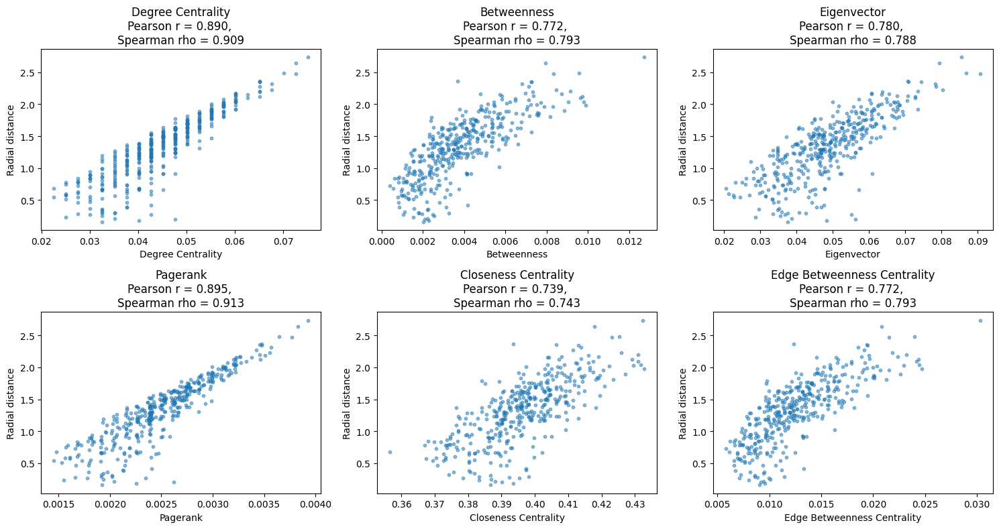

In [19]:
"""
SBM graph: community structure
"""
run_benchmark(generate_sbm, {"n_per_block": 100, "num_blocks": 4, "p_in": 0.15, "p_out": 0.01}, dim=2, L_min=60, sample_size=1024, batch_size=512, num_iterations=80)

2025-04-10 03:17:22.149 | DEBUG    | __main__:run_benchmark:25 - Vertices 1000, edges 4975
2025-04-10 03:17:22.150 | INFO     | __main__:__init__:61 - Logger initialized
2025-04-10 03:17:22.150 | INFO     | __main__:_laplacian_embedding:68 - Computing Laplacian embedding
2025-04-10 03:17:22.168 | INFO     | __main__:_laplacian_embedding:78 - Laplacian embedding done
2025-04-10 03:17:22.169 | INFO     | __main__:run_layout:193 - Running layout
  0%|          | 0/60 [00:00<?, ?it/s]2025-04-10 03:17:22.171 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:17:22.176 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:17:22.208 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:17:22.210 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:17:22.211 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:17:22.216 | INFO     | __main__:locate_knn_midpoints

Degree centrality         ↔ radial distance: Pearson's r = 0.967, p = 0.00e+00
Degree centrality         ↔ radial distance: Spearman's rho = 0.873, p = 1.64e-313
Betweenness centrality    ↔ radial distance: Pearson's r = 0.905, p = 0.00e+00
Betweenness centrality    ↔ radial distance: Spearman's rho = 0.805, p = 6.34e-229
Eigenvector centrality    ↔ radial distance: Pearson's r = 0.677, p = 3.41e-128
Eigenvector centrality    ↔ radial distance: Spearman's rho = 0.423, p = 9.44e-45
PageRank                  ↔ radial distance: Pearson's r = 0.973, p = 0.00e+00
PageRank                  ↔ radial distance: Spearman's rho = 0.897, p = 0.00e+00
Closeness centrality      ↔ radial distance: Pearson's r = 0.595, p = 5.99e-92
Closeness centrality      ↔ radial distance: Spearman's rho = 0.446, p = 5.38e-50
Edge Betweenness centrality ↔ radial distance: Pearson's r = 0.905, p = 0.00e+00
Edge Betweenness centrality ↔ radial distance: Spearman's rho = 0.805, p = 6.34e-229

 Pearson Correlation Matr

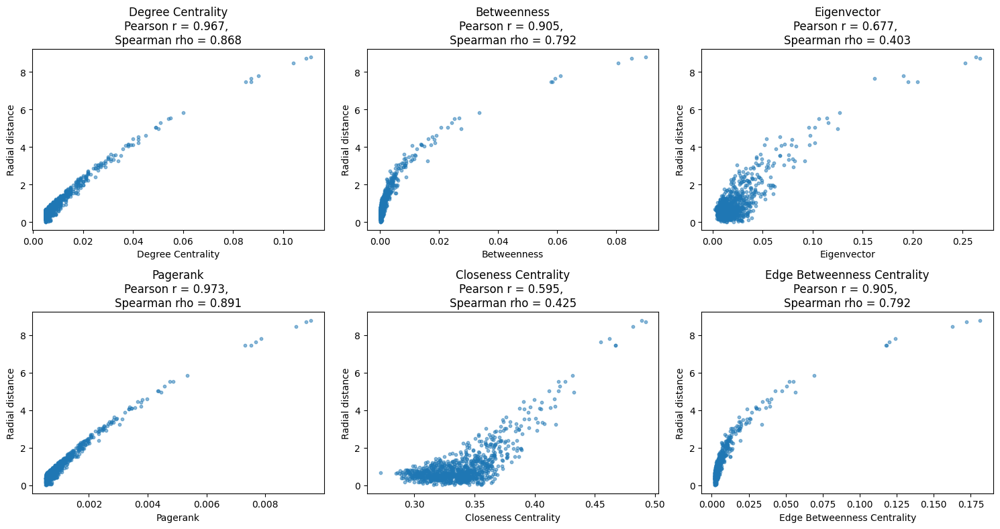

In [20]:
"""
Barabási–Albert model: scale-free network
"""

run_benchmark(generate_ba, {"n": 1000, "m": 5}, dim=2, L_min=20, sample_size=2048, batch_size=512, num_iterations=60)

2025-04-10 03:17:31.010 | DEBUG    | __main__:run_benchmark:25 - Vertices 1000, edges 3000
2025-04-10 03:17:31.011 | INFO     | __main__:__init__:61 - Logger initialized
2025-04-10 03:17:31.012 | INFO     | __main__:_laplacian_embedding:68 - Computing Laplacian embedding
2025-04-10 03:17:31.030 | INFO     | __main__:_laplacian_embedding:78 - Laplacian embedding done
2025-04-10 03:17:31.031 | INFO     | __main__:run_layout:193 - Running layout
  0%|          | 0/60 [00:00<?, ?it/s]2025-04-10 03:17:31.033 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:17:31.039 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:17:31.060 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:17:31.062 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:17:31.063 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:17:31.068 | INFO     | __main__:locate_knn_midpoints

Degree centrality         ↔ radial distance: Pearson's r = 0.889, p = 0.00e+00
Degree centrality         ↔ radial distance: Spearman's rho = 0.910, p = 0.00e+00
Betweenness centrality    ↔ radial distance: Pearson's r = 0.718, p = 1.29e-151
Betweenness centrality    ↔ radial distance: Spearman's rho = 0.759, p = 4.39e-188
Eigenvector centrality    ↔ radial distance: Pearson's r = 0.624, p = 1.10e-103
Eigenvector centrality    ↔ radial distance: Spearman's rho = 0.671, p = 1.35e-131
PageRank                  ↔ radial distance: Pearson's r = 0.895, p = 0.00e+00
PageRank                  ↔ radial distance: Spearman's rho = 0.906, p = 0.00e+00
Closeness centrality      ↔ radial distance: Pearson's r = 0.560, p = 1.34e-79
Closeness centrality      ↔ radial distance: Spearman's rho = 0.608, p = 5.61e-102
Edge Betweenness centrality ↔ radial distance: Pearson's r = 0.718, p = 1.29e-151
Edge Betweenness centrality ↔ radial distance: Spearman's rho = 0.759, p = 4.39e-188

 Pearson Correlation M

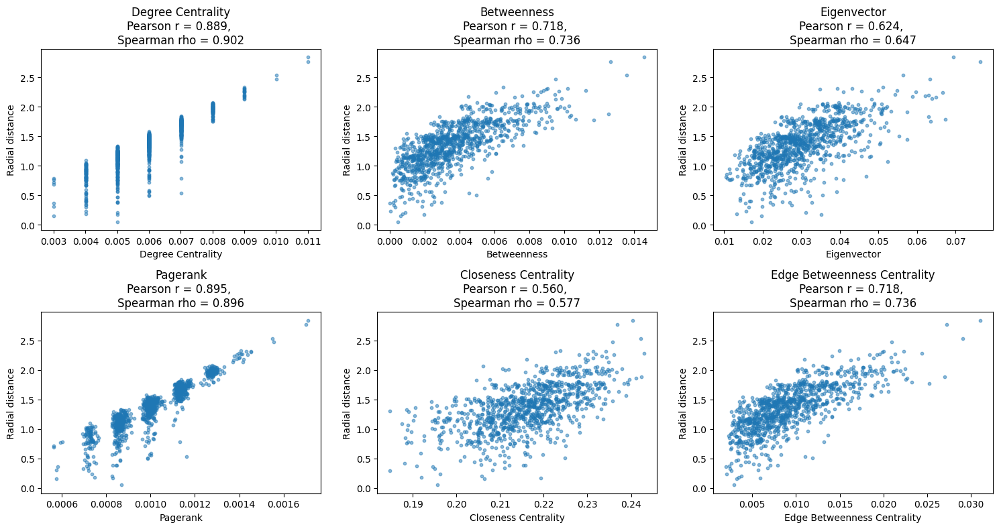

In [21]:
"""
Watts-Strogaz model
"""

run_benchmark(generate_ws, {"n": 1000, "k": 6, "p": 0.3}, dim=2, L_min=40, sample_size=2048, batch_size=512, num_iterations=60)

2025-04-10 03:17:38.980 | DEBUG    | __main__:run_benchmark:25 - Vertices 1000, edges 4963
2025-04-10 03:17:38.993 | INFO     | __main__:__init__:61 - Logger initialized
2025-04-10 03:17:38.994 | INFO     | __main__:_laplacian_embedding:68 - Computing Laplacian embedding
2025-04-10 03:17:39.009 | INFO     | __main__:_laplacian_embedding:78 - Laplacian embedding done
2025-04-10 03:17:39.010 | INFO     | __main__:run_layout:193 - Running layout
  0%|          | 0/60 [00:00<?, ?it/s]2025-04-10 03:17:39.012 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:17:39.452 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:17:42.507 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:17:42.934 | INFO     | __main__:update_positions:187 - Positions updated
  2%|▏         | 1/60 [00:03<03:51,  3.92s/it]2025-04-10 03:17:42.935 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:17:42.

Degree centrality         ↔ radial distance: Pearson's r = 0.963, p = 0.00e+00
Degree centrality         ↔ radial distance: Spearman's rho = 0.861, p = 8.18e-296
Betweenness centrality    ↔ radial distance: Pearson's r = 0.908, p = 0.00e+00
Betweenness centrality    ↔ radial distance: Spearman's rho = 0.773, p = 2.92e-199
Eigenvector centrality    ↔ radial distance: Pearson's r = 0.625, p = 5.27e-104
Eigenvector centrality    ↔ radial distance: Spearman's rho = 0.491, p = 6.95e-62
PageRank                  ↔ radial distance: Pearson's r = 0.967, p = 0.00e+00
PageRank                  ↔ radial distance: Spearman's rho = 0.878, p = 4.15e-321
Closeness centrality      ↔ radial distance: Pearson's r = 0.497, p = 2.20e-60
Closeness centrality      ↔ radial distance: Spearman's rho = 0.450, p = 3.88e-51
Edge Betweenness centrality ↔ radial distance: Pearson's r = 0.908, p = 0.00e+00
Edge Betweenness centrality ↔ radial distance: Spearman's rho = 0.773, p = 2.92e-199

 Pearson Correlation Mat

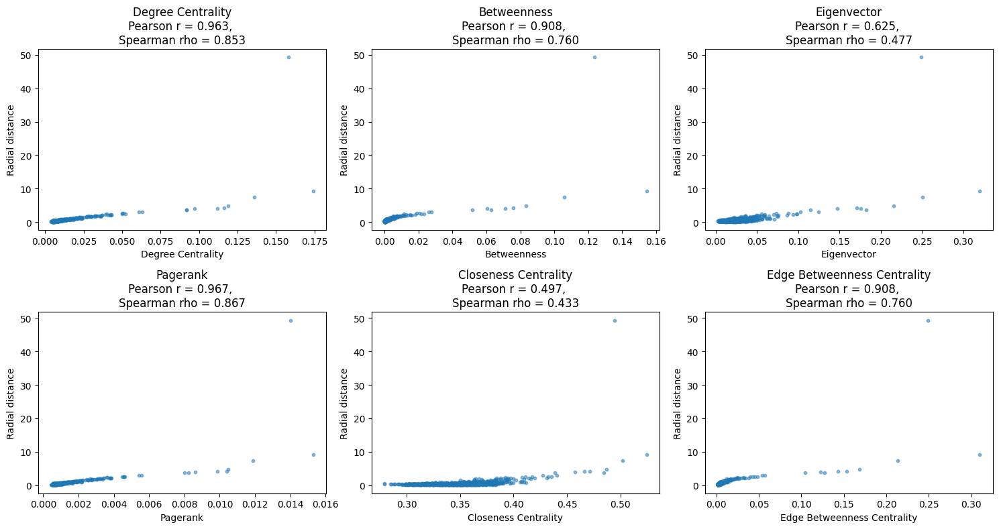

In [22]:
"""
Power cluster model
"""

run_benchmark(generate_power_cluster, {"n": 1000, "m": 5, "p": 0.5}, sample_size=2048, batch_size=512, num_iterations=60)

2025-04-10 03:17:51.675 | DEBUG    | __main__:run_benchmark:25 - Vertices 1200, edges 2330
2025-04-10 03:17:51.676 | INFO     | __main__:__init__:61 - Logger initialized
2025-04-10 03:17:51.678 | INFO     | __main__:_laplacian_embedding:68 - Computing Laplacian embedding
2025-04-10 03:17:51.735 | INFO     | __main__:_laplacian_embedding:78 - Laplacian embedding done
2025-04-10 03:17:51.738 | INFO     | __main__:run_layout:193 - Running layout
  0%|          | 0/60 [00:00<?, ?it/s]2025-04-10 03:17:51.740 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:17:51.746 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:17:51.753 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:17:51.756 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:17:51.757 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:17:51.762 | INFO     | __main__:locate_knn_midpoints

Degree centrality         ↔ radial distance: Pearson's r = 0.808, p = 1.43e-263
Degree centrality         ↔ radial distance: Spearman's rho = 0.547, p = 1.05e-94
Betweenness centrality    ↔ radial distance: Pearson's r = 0.426, p = 1.69e-51
Betweenness centrality    ↔ radial distance: Spearman's rho = 0.262, p = 2.55e-20
Eigenvector centrality    ↔ radial distance: Pearson's r = 0.389, p = 1.60e-42
Eigenvector centrality    ↔ radial distance: Spearman's rho = 0.260, p = 4.62e-20
PageRank                  ↔ radial distance: Pearson's r = 0.631, p = 1.64e-127
PageRank                  ↔ radial distance: Spearman's rho = 0.341, p = 5.53e-34
Closeness centrality      ↔ radial distance: Pearson's r = 0.376, p = 1.18e-39
Closeness centrality      ↔ radial distance: Spearman's rho = 0.224, p = 4.31e-15
Edge Betweenness centrality ↔ radial distance: Pearson's r = 0.426, p = 1.69e-51
Edge Betweenness centrality ↔ radial distance: Spearman's rho = 0.262, p = 2.66e-20

 Pearson Correlation Matrix

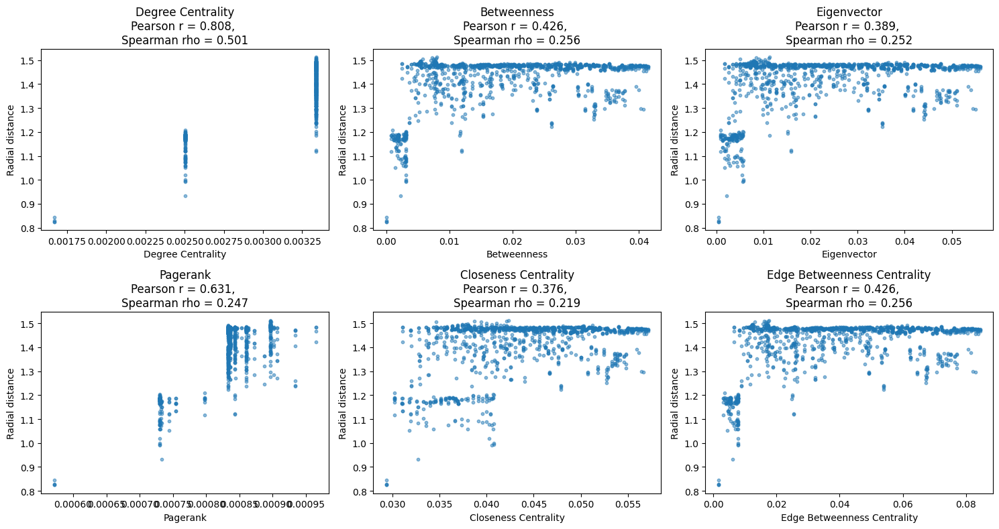

In [23]:
"""
Road network: 2D grid graph
"""

run_benchmark(generate_road_network, {"width": 30, "height": 40}, dim=2, num_iterations=60)

2025-04-10 03:18:00.769 | DEBUG    | __main__:run_benchmark:25 - Vertices 150, edges 5000
2025-04-10 03:18:00.770 | INFO     | __main__:__init__:61 - Logger initialized
2025-04-10 03:18:00.770 | INFO     | __main__:_laplacian_embedding:68 - Computing Laplacian embedding
2025-04-10 03:18:00.774 | INFO     | __main__:_laplacian_embedding:78 - Laplacian embedding done
2025-04-10 03:18:00.775 | INFO     | __main__:run_layout:193 - Running layout
  0%|          | 0/5 [00:00<?, ?it/s]2025-04-10 03:18:00.776 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:00.899 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:00.909 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:00.911 | INFO     | __main__:update_positions:187 - Positions updated
 20%|██        | 1/5 [00:00<00:00,  7.38it/s]2025-04-10 03:18:00.912 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:00.917

Degree centrality         ↔ radial distance: Pearson's r = 0.998, p = 1.77e-178
Degree centrality         ↔ radial distance: Spearman's rho = 0.817, p = 3.92e-37
Betweenness centrality    ↔ radial distance: Pearson's r = 0.998, p = 1.77e-178
Betweenness centrality    ↔ radial distance: Spearman's rho = 0.817, p = 3.92e-37
Eigenvector centrality    ↔ radial distance: Pearson's r = 0.998, p = 1.77e-178
Eigenvector centrality    ↔ radial distance: Spearman's rho = 0.651, p = 1.90e-19
PageRank                  ↔ radial distance: Pearson's r = 0.998, p = 1.77e-178
PageRank                  ↔ radial distance: Spearman's rho = 0.817, p = 3.92e-37
Closeness centrality      ↔ radial distance: Pearson's r = 0.998, p = 1.77e-178
Closeness centrality      ↔ radial distance: Spearman's rho = 0.817, p = 3.92e-37
Edge Betweenness centrality ↔ radial distance: Pearson's r = 0.998, p = 1.77e-178
Edge Betweenness centrality ↔ radial distance: Spearman's rho = 0.686, p = 3.22e-22

 Pearson Correlation Ma

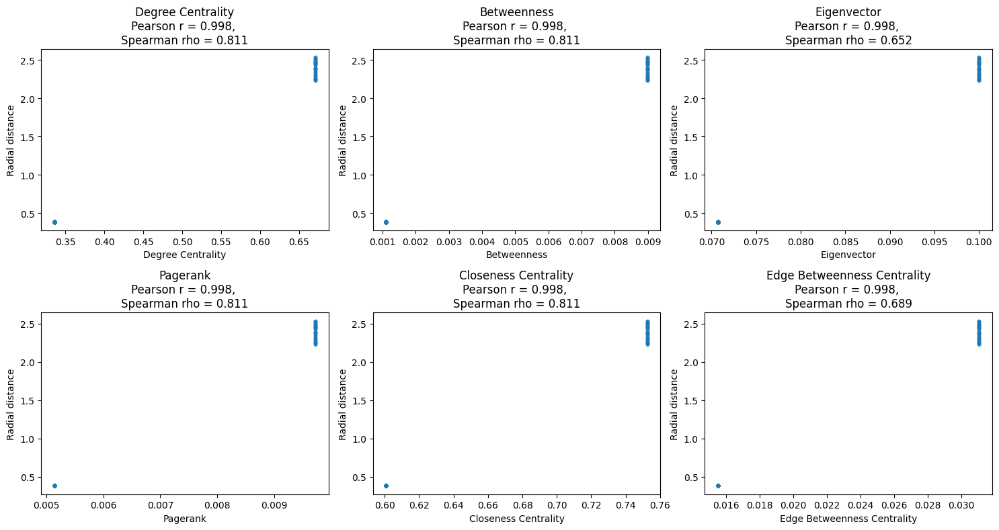

In [24]:
"""
Bipartite graph
"""

run_benchmark(generate_bipartite_graph, {"n_top": 50, "n_bottom": 100}, dim=2, num_iterations=5)

2025-04-10 03:18:02.483 | DEBUG    | __main__:run_benchmark:25 - Vertices 2047, edges 2046
2025-04-10 03:18:02.497 | INFO     | __main__:__init__:61 - Logger initialized
2025-04-10 03:18:02.498 | INFO     | __main__:_laplacian_embedding:68 - Computing Laplacian embedding
2025-04-10 03:18:02.674 | INFO     | __main__:_laplacian_embedding:78 - Laplacian embedding done
2025-04-10 03:18:02.689 | INFO     | __main__:run_layout:193 - Running layout
  0%|          | 0/60 [00:00<?, ?it/s]2025-04-10 03:18:02.691 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:03.130 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:05.596 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:06.349 | INFO     | __main__:update_positions:187 - Positions updated
  2%|▏         | 1/60 [00:03<03:35,  3.66s/it]2025-04-10 03:18:06.351 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:06.

Degree centrality         ↔ radial distance: Pearson's r = 0.974, p = 0.00e+00
Degree centrality         ↔ radial distance: Spearman's rho = 0.866, p = 0.00e+00
Betweenness centrality    ↔ radial distance: Pearson's r = 0.192, p = 1.37e-17
Betweenness centrality    ↔ radial distance: Spearman's rho = 0.738, p = 0.00e+00
Eigenvector centrality    ↔ radial distance: Pearson's r = 0.458, p = 1.44e-101
Eigenvector centrality    ↔ radial distance: Spearman's rho = 0.686, p = 7.29e-285
PageRank                  ↔ radial distance: Pearson's r = 0.967, p = 0.00e+00
PageRank                  ↔ radial distance: Spearman's rho = 0.882, p = 0.00e+00
Closeness centrality      ↔ radial distance: Pearson's r = 0.573, p = 5.27e-170
Closeness centrality      ↔ radial distance: Spearman's rho = 0.738, p = 0.00e+00
Edge Betweenness centrality ↔ radial distance: Pearson's r = 0.192, p = 1.37e-17
Edge Betweenness centrality ↔ radial distance: Spearman's rho = 0.738, p = 0.00e+00

 Pearson Correlation Matri

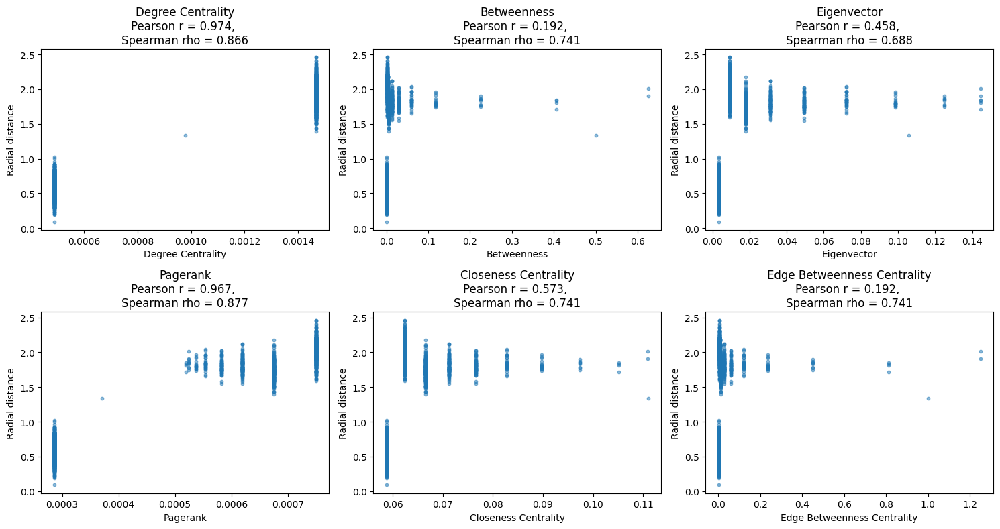

In [25]:
"""
Balanced binary tree
"""

run_benchmark(generate_balanced_tree, {"r": 2, "h": 10}, dim=2, sample_size=2046, batch_size=512, num_iterations=60)

In [26]:
test_graphs = [

      (generate_sbm, "SBM Graph",
      {"n_per_block": 100, "num_blocks": 4, "p_in": 0.15, "p_out": 0.01},
      {"dim": 2, "L_min": 60, "sample_size": 1024, "batch_size": 512, "num_iterations": 80}),

      (generate_ba, "Barabási–Albert Graph",
      {"n": 1000, "m": 5},
      {"dim": 2, "L_min": 20, "sample_size": 2048, "batch_size": 512, "num_iterations": 60}),

      (generate_ws, "Watts-Strogaz Graph",
      {"n": 1000, "k": 6, "p": 0.3},
      {"dim": 2, "L_min": 40, "sample_size": 2048, "batch_size": 512, "num_iterations": 60}),

      (generate_power_cluster, "Powerlaw Cluster Graph",
      {"n": 1000, "m": 5, "p": 0.5},
      {"sample_size": 2048, "batch_size": 512, "num_iterations": 60}),

      (generate_road_network, "Road Network (Grid)",
      {"width": 30, "height": 40},
      {"dim": 2, "num_iterations": 60}),

      (generate_bipartite_graph, "Bipartite Graph",
      {"n_top": 50, "n_bottom": 100},
      {"dim": 2, "num_iterations": 5}),

      (generate_balanced_tree, "Balanced Binary Tree",
      {"r": 2, "h": 10},
      {"dim": 2, "sample_size": 2046, "batch_size": 512, "num_iterations": 60})

  ]

In [27]:
def benchmark_correlations(graph_generator, graph_params, dim=2, L_min=10.0, k_attr=0.5, k_inter=0.1, knn_k=15, sample_size=512, batch_size=1024, num_iterations=40):

    edges, G = graph_generator(**graph_params)
    edges = jnp.array(edges)
    n = G.number_of_nodes()

    gm = GraphEmbedder(edges, n,
                      dimension=dim,
                      L_min=L_min,
                      k_attr=k_attr,
                      k_inter=k_inter,
                      knn_k=knn_k,
                      sample_size=sample_size,
                      batch_size=batch_size,
                      my_logger=None)
    positions = gm.run_layout(num_iterations)
    positions = np.array(positions)
    radii = np.linalg.norm(positions, axis=1)


    # Classical centrality measures
    deg = np.array(list(nx.degree_centrality(G).values()))
    btw = np.array(list(nx.betweenness_centrality(G).values()))
    eig = np.array(list(nx.eigenvector_centrality_numpy(G).values()))
    pr = np.array(list(nx.pagerank(G).values()))
    clo = np.array(list(nx.closeness_centrality(G).values()))

    # Edge betweenness aggregated to nodes
    edge_btw = nx.edge_betweenness_centrality(G)
    edge_btw_node = np.zeros(n)
    for (u, v), val in edge_btw.items():
        edge_btw_node[u] += val
        edge_btw_node[v] += val

    metrics = {
        "Degree": deg,
        "Betweenness": btw,
        "Eigenvector": eig,
        "PageRank": pr,
        "Closeness": clo,
        "Edge Betweenness": edge_btw_node
    }

    correlations = {}
    for label, vec in metrics.items():
        pear_r, _ = pearsonr(radii, vec)
        spear_r, _ = spearmanr(radii, vec)
        correlations[label] = {"Pearson": float(pear_r), "Spearman": float(spear_r)}

    return correlations

In [28]:
benchmark_results = {}
for graph_generator, graph_name, graph_params, params in tqdm(test_graphs):
    logger.info(f"Running benchmark for {graph_name}")
    benchmark_results[graph_name] = benchmark_correlations(graph_generator, graph_params, **params)

  0%|          | 0/7 [00:00<?, ?it/s]2025-04-10 03:18:26.915 | INFO     | __main__:<cell line: 0>:3 - Running benchmark for SBM Graph


2025-04-10 03:18:26.939 | INFO     | __main__:_laplacian_embedding:68 - Computing Laplacian embedding
2025-04-10 03:18:26.943 | INFO     | __main__:_laplacian_embedding:78 - Laplacian embedding done
2025-04-10 03:18:26.944 | INFO     | __main__:run_layout:193 - Running layout



  0%|          | 0/80 [00:00<?, ?it/s]

2025-04-10 03:18:26.947 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:26.952 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:26.965 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:26.967 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:26.968 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:26.972 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:26.984 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:26.986 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:26.987 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:26.991 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:27.003 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


  8%|▊         | 6/80 [00:00<00:01, 51.12it/s]

2025-04-10 03:18:27.066 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:27.071 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:27.082 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:27.084 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:27.085 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:27.090 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:27.101 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:27.103 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:27.104 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:27.108 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:27.120 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 15%|█▌        | 12/80 [00:00<00:01, 51.37it/s]

2025-04-10 03:18:27.182 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:27.187 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:27.198 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:27.200 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:27.200 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:27.204 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:27.215 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:27.216 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:27.217 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:27.221 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:27.231 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 22%|██▎       | 18/80 [00:00<00:01, 53.54it/s]

2025-04-10 03:18:27.289 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:27.293 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:27.303 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:27.305 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:27.305 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:27.310 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:27.321 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:27.323 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:27.323 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:27.328 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:27.338 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 30%|███       | 24/80 [00:00<00:01, 54.68it/s]

2025-04-10 03:18:27.395 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:27.400 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:27.410 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:27.412 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:27.412 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:27.417 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:27.426 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:27.428 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:27.428 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:27.433 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:27.443 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 38%|███▊      | 30/80 [00:00<00:00, 56.41it/s]

2025-04-10 03:18:27.495 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:27.499 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:27.509 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:27.511 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:27.512 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:27.517 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:27.526 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:27.528 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:27.529 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:27.534 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:27.543 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 45%|████▌     | 36/80 [00:00<00:00, 57.35it/s]

2025-04-10 03:18:27.596 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:27.601 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:27.611 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:27.612 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:27.613 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:27.617 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:27.627 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:27.629 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:27.629 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:27.634 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:27.643 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 52%|█████▎    | 42/80 [00:00<00:00, 57.84it/s]

2025-04-10 03:18:27.698 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:27.703 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:27.713 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:27.715 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:27.715 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:27.720 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:27.730 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:27.731 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:27.732 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:27.737 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:27.746 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 61%|██████▏   | 49/80 [00:00<00:00, 58.70it/s]

2025-04-10 03:18:27.814 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:27.819 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:27.828 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:27.830 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:27.830 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:27.835 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:27.844 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:27.846 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:27.847 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:27.852 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:27.861 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 70%|███████   | 56/80 [00:00<00:00, 59.43it/s]

2025-04-10 03:18:27.929 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:27.935 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:27.944 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:27.946 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:27.946 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:27.951 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:27.961 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:27.962 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:27.963 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:27.967 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:27.977 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 78%|███████▊  | 62/80 [00:01<00:00, 59.45it/s]

2025-04-10 03:18:28.030 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:28.035 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:28.044 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:28.046 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:28.047 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:28.052 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:28.061 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:28.063 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:28.063 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:28.068 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:28.077 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 85%|████████▌ | 68/80 [00:01<00:00, 59.50it/s]

2025-04-10 03:18:28.130 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:28.135 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:28.145 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:28.147 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:28.147 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:28.152 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:28.162 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:28.163 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:28.164 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:28.169 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:28.178 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 92%|█████████▎| 74/80 [00:01<00:00, 59.61it/s]

2025-04-10 03:18:28.231 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:28.236 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:28.245 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:28.247 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:28.247 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:28.253 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:28.262 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:28.264 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:28.265 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:28.270 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:28.279 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 14%|█▍        | 1/7 [00:02<00:15,  2.65s/it]

2025-04-10 03:18:29.565 | INFO     | __main__:<cell line: 0>:3 - Running benchmark for Barabási–Albert Graph
2025-04-10 03:18:29.585 | INFO     | __main__:_laplacian_embedding:68 - Computing Laplacian embedding
2025-04-10 03:18:29.602 | INFO     | __main__:_laplacian_embedding:78 - Laplacian embedding done
2025-04-10 03:18:29.603 | INFO     | __main__:run_layout:193 - Running layout



  0%|          | 0/60 [00:00<?, ?it/s]

2025-04-10 03:18:29.607 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:29.612 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:29.637 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:29.639 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:29.640 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:29.647 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:29.671 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:29.673 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:29.673 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:29.679 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:29.703 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


  7%|▋         | 4/60 [00:00<00:01, 30.45it/s]

2025-04-10 03:18:29.740 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:29.745 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:29.768 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:29.770 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:29.771 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:29.775 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:29.799 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:29.801 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:29.802 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:29.806 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:29.824 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 13%|█▎        | 8/60 [00:00<00:01, 33.31it/s]

2025-04-10 03:18:29.852 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:29.857 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:29.874 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:29.876 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:29.877 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:29.881 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:29.898 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:29.900 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:29.901 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:29.905 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:29.923 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 22%|██▏       | 13/60 [00:00<00:01, 36.70it/s]

2025-04-10 03:18:29.975 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:29.980 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:29.998 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:30.000 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:30.000 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:30.005 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:30.020 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:30.022 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:30.023 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:30.028 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:30.043 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 30%|███       | 18/60 [00:00<00:01, 39.06it/s]

2025-04-10 03:18:30.092 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:30.098 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:30.113 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:30.115 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:30.115 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:30.120 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:30.136 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:30.138 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:30.139 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:30.143 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:30.159 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 38%|███▊      | 23/60 [00:00<00:00, 40.52it/s]

2025-04-10 03:18:30.208 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:30.213 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:30.228 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:30.230 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:30.231 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:30.235 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:30.250 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:30.252 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:30.253 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:30.257 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:30.273 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 47%|████▋     | 28/60 [00:00<00:00, 41.55it/s]

2025-04-10 03:18:30.322 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:30.327 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:30.343 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:30.345 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:30.345 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:30.350 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:30.365 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:30.367 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:30.368 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:30.373 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:30.388 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 55%|█████▌    | 33/60 [00:00<00:00, 42.06it/s]

2025-04-10 03:18:30.438 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:30.443 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:30.459 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:30.461 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:30.461 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:30.466 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:30.481 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:30.483 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:30.484 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:30.488 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:30.504 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 63%|██████▎   | 38/60 [00:00<00:00, 42.52it/s]

2025-04-10 03:18:30.554 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:30.558 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:30.574 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:30.576 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:30.576 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:30.581 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:30.596 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:30.598 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:30.599 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:30.604 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:30.620 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 72%|███████▏  | 43/60 [00:01<00:00, 42.68it/s]

2025-04-10 03:18:30.669 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:30.674 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:30.690 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:30.692 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:30.692 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:30.697 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:30.712 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:30.714 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:30.715 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:30.720 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:30.735 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 80%|████████  | 48/60 [00:01<00:00, 42.92it/s]

2025-04-10 03:18:30.784 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:30.790 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:30.806 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:30.808 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:30.808 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:30.812 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:30.828 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:30.830 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:30.830 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:30.835 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:30.851 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 88%|████████▊ | 53/60 [00:01<00:00, 42.96it/s]

2025-04-10 03:18:30.901 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:30.907 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:30.922 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:30.924 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:30.925 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:30.930 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:30.945 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:30.947 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:30.948 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:30.953 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:30.968 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 97%|█████████▋| 58/60 [00:01<00:00, 42.91it/s]

2025-04-10 03:18:31.017 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:31.023 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:31.038 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:31.040 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:31.041 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:31.046 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:31.061 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:31.062 | INFO     | __main__:update_positions:187 - Positions updated


 29%|██▊       | 2/7 [00:10<00:29,  5.85s/it]

2025-04-10 03:18:37.654 | INFO     | __main__:<cell line: 0>:3 - Running benchmark for Watts-Strogaz Graph
2025-04-10 03:18:37.671 | INFO     | __main__:_laplacian_embedding:68 - Computing Laplacian embedding
2025-04-10 03:18:37.691 | INFO     | __main__:_laplacian_embedding:78 - Laplacian embedding done
2025-04-10 03:18:37.692 | INFO     | __main__:run_layout:193 - Running layout



  0%|          | 0/60 [00:00<?, ?it/s]

2025-04-10 03:18:37.695 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:37.704 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:37.728 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:37.731 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:37.733 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:37.740 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:37.761 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:37.764 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:37.765 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:37.774 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:37.795 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


  5%|▌         | 3/60 [00:00<00:01, 28.86it/s]

2025-04-10 03:18:37.801 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:37.810 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:37.832 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:37.834 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:37.835 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:37.840 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:37.861 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:37.863 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:37.863 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:37.868 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:37.889 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 12%|█▏        | 7/60 [00:00<00:01, 31.54it/s]

2025-04-10 03:18:37.921 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:37.926 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:37.947 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:37.949 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:37.950 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:37.955 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:37.975 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:37.977 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:37.978 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:37.983 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:38.003 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 18%|█▊        | 11/60 [00:00<00:01, 33.14it/s]

2025-04-10 03:18:38.035 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:38.041 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:38.056 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:38.058 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:38.059 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:38.064 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:38.079 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:38.081 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:38.082 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:38.088 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:38.104 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 27%|██▋       | 16/60 [00:00<00:01, 36.72it/s]

2025-04-10 03:18:38.155 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:38.160 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:38.175 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:38.177 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:38.178 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:38.183 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:38.199 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:38.200 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:38.201 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:38.206 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:38.222 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 35%|███▌      | 21/60 [00:00<00:00, 39.18it/s]

2025-04-10 03:18:38.269 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:38.274 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:38.288 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:38.290 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:38.291 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:38.297 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:38.310 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:38.312 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:38.313 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:38.317 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:38.331 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 43%|████▎     | 26/60 [00:00<00:00, 41.27it/s]

2025-04-10 03:18:38.379 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:38.384 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:38.398 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:38.400 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:38.400 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:38.406 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:38.419 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:38.421 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:38.422 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:38.427 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:38.440 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 52%|█████▏    | 31/60 [00:00<00:00, 42.84it/s]

2025-04-10 03:18:38.487 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:38.492 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:38.505 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:38.507 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:38.508 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:38.513 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:38.526 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:38.528 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:38.529 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:38.534 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:38.546 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 60%|██████    | 36/60 [00:00<00:00, 44.52it/s]

2025-04-10 03:18:38.590 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:38.595 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:38.608 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:38.610 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:38.610 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:38.615 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:38.627 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:38.629 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:38.630 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:38.635 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:38.647 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 70%|███████   | 42/60 [00:01<00:00, 46.45it/s]

2025-04-10 03:18:38.710 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:38.715 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:38.726 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:38.728 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:38.729 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:38.734 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:38.746 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:38.748 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:38.748 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:38.753 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:38.765 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 80%|████████  | 48/60 [00:01<00:00, 48.05it/s]

2025-04-10 03:18:38.826 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:38.831 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:38.843 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:38.844 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:38.845 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:38.850 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:38.861 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:38.863 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:38.864 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:38.869 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:38.881 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 90%|█████████ | 54/60 [00:01<00:00, 49.27it/s]

2025-04-10 03:18:38.942 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:38.947 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:38.958 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:38.960 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:38.961 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:38.966 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:38.978 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:38.979 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:38.980 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:38.985 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:38.997 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 43%|████▎     | 3/7 [00:17<00:25,  6.49s/it]

2025-04-10 03:18:44.899 | INFO     | __main__:<cell line: 0>:3 - Running benchmark for Powerlaw Cluster Graph
2025-04-10 03:18:44.928 | INFO     | __main__:_laplacian_embedding:68 - Computing Laplacian embedding
2025-04-10 03:18:44.938 | INFO     | __main__:_laplacian_embedding:78 - Laplacian embedding done
2025-04-10 03:18:44.940 | INFO     | __main__:run_layout:193 - Running layout



  0%|          | 0/60 [00:00<?, ?it/s]

2025-04-10 03:18:44.943 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:45.216 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:46.681 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:47.067 | INFO     | __main__:update_positions:187 - Positions updated



  2%|▏         | 1/60 [00:02<02:05,  2.13s/it]

2025-04-10 03:18:47.071 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:47.077 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:47.109 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:47.111 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:47.111 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:47.116 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:47.148 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:47.150 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:47.150 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:47.156 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:47.187 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


  7%|▋         | 4/60 [00:02<00:24,  2.30it/s]

2025-04-10 03:18:47.191 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:47.197 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:47.228 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:47.230 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:47.230 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:47.235 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:47.266 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:47.268 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:47.269 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:47.274 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:47.295 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 12%|█▏        | 7/60 [00:02<00:11,  4.53it/s]

2025-04-10 03:18:47.299 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:47.304 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:47.325 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:47.327 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:47.328 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:47.333 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:47.354 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:47.355 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:47.356 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:47.361 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:47.382 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 18%|█▊        | 11/60 [00:02<00:06,  8.08it/s]

2025-04-10 03:18:47.414 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:47.419 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:47.440 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:47.442 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:47.442 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:47.446 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:47.467 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:47.469 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:47.469 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:47.474 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:47.490 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 25%|██▌       | 15/60 [00:02<00:03, 12.11it/s]

2025-04-10 03:18:47.516 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:47.521 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:47.537 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:47.539 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:47.539 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:47.544 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:47.560 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:47.562 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:47.562 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:47.567 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:47.583 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 33%|███▎      | 20/60 [00:02<00:02, 17.52it/s]

2025-04-10 03:18:47.632 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:47.637 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:47.653 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:47.654 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:47.655 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:47.659 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:47.675 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:47.677 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:47.677 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:47.682 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:47.698 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 42%|████▏     | 25/60 [00:02<00:01, 22.62it/s]

2025-04-10 03:18:47.748 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:47.752 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:47.768 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:47.770 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:47.770 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:47.775 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:47.791 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:47.793 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:47.793 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:47.798 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:47.813 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 50%|█████     | 30/60 [00:02<00:01, 27.19it/s]

2025-04-10 03:18:47.863 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:47.868 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:47.884 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:47.886 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:47.887 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:47.891 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:47.907 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:47.909 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:47.910 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:47.915 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:47.930 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 58%|█████▊    | 35/60 [00:03<00:00, 30.98it/s]

2025-04-10 03:18:47.979 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:47.984 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:47.999 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:48.001 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:48.002 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:48.007 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:48.022 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:48.024 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:48.025 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:48.030 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:48.045 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 67%|██████▋   | 40/60 [00:03<00:00, 34.13it/s]

2025-04-10 03:18:48.095 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:48.100 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:48.115 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:48.117 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:48.118 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:48.123 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:48.138 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:48.140 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:48.141 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:48.145 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:48.160 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 75%|███████▌  | 45/60 [00:03<00:00, 36.62it/s]

2025-04-10 03:18:48.210 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:48.215 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:48.230 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:48.232 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:48.232 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:48.237 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:48.253 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:48.255 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:48.255 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:48.260 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:48.275 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 83%|████████▎ | 50/60 [00:03<00:00, 38.56it/s]

2025-04-10 03:18:48.324 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:48.329 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:48.344 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:48.347 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:48.347 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:48.352 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:48.367 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:48.369 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:48.369 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:48.374 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:48.389 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 92%|█████████▏| 55/60 [00:03<00:00, 40.06it/s]

2025-04-10 03:18:48.438 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:48.443 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:48.458 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:48.460 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:48.461 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:48.466 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:48.481 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:48.483 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:48.484 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:48.488 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:48.504 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 57%|█████▋    | 4/7 [00:28<00:23,  7.93s/it]

2025-04-10 03:18:55.052 | INFO     | __main__:<cell line: 0>:3 - Running benchmark for Road Network (Grid)
2025-04-10 03:18:55.071 | INFO     | __main__:_laplacian_embedding:68 - Computing Laplacian embedding
2025-04-10 03:18:55.119 | INFO     | __main__:_laplacian_embedding:78 - Laplacian embedding done
2025-04-10 03:18:55.120 | INFO     | __main__:run_layout:193 - Running layout



  0%|          | 0/60 [00:00<?, ?it/s]

2025-04-10 03:18:55.123 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:55.129 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:55.138 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:55.140 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:55.141 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:55.146 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:55.154 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:55.156 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:55.157 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:55.162 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:55.175 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 10%|█         | 6/60 [00:00<00:00, 56.73it/s]

2025-04-10 03:18:55.231 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:55.238 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:55.245 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:55.247 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:55.247 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:55.253 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:55.259 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:55.261 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:55.262 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:55.266 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:55.273 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 22%|██▏       | 13/60 [00:00<00:00, 62.87it/s]

2025-04-10 03:18:55.334 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:55.340 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:55.346 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:55.348 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:55.349 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:55.354 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:55.361 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:55.363 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:55.364 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:55.368 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:55.375 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 33%|███▎      | 20/60 [00:00<00:00, 65.48it/s]

2025-04-10 03:18:55.437 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:55.442 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:55.449 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:55.451 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:55.451 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:55.455 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:55.462 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:55.464 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:55.465 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:55.469 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:55.476 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 45%|████▌     | 27/60 [00:00<00:00, 67.20it/s]

2025-04-10 03:18:55.537 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:55.542 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:55.549 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:55.551 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:55.552 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:55.556 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:55.563 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:55.565 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:55.566 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:55.570 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:55.576 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 57%|█████▋    | 34/60 [00:00<00:00, 67.86it/s]

2025-04-10 03:18:55.638 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:55.643 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:55.650 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:55.652 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:55.653 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:55.657 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:55.664 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:55.666 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:55.666 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:55.672 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:55.679 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 68%|██████▊   | 41/60 [00:00<00:00, 68.16it/s]

2025-04-10 03:18:55.740 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:55.745 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:55.752 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:55.754 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:55.754 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:55.759 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:55.765 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:55.767 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:55.768 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:55.773 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:55.779 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 82%|████████▏ | 49/60 [00:00<00:00, 69.21it/s]

2025-04-10 03:18:55.852 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:55.858 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:55.864 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:55.866 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:55.866 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:55.871 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:55.877 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:55.879 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:55.880 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:55.885 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:55.891 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 95%|█████████▌| 57/60 [00:00<00:00, 70.09it/s]

2025-04-10 03:18:55.963 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:55.969 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:55.975 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:55.977 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:55.978 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:55.983 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:55.989 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:18:55.991 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:18:55.992 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:18:55.996 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:18:56.003 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025

 71%|███████▏  | 5/7 [00:36<00:15,  7.98s/it]

2025-04-10 03:19:03.111 | INFO     | __main__:<cell line: 0>:3 - Running benchmark for Bipartite Graph
2025-04-10 03:19:03.126 | INFO     | __main__:_laplacian_embedding:68 - Computing Laplacian embedding
2025-04-10 03:19:03.129 | INFO     | __main__:_laplacian_embedding:78 - Laplacian embedding done
2025-04-10 03:19:03.130 | INFO     | __main__:run_layout:193 - Running layout



  0%|          | 0/5 [00:00<?, ?it/s]

2025-04-10 03:19:03.133 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:19:03.138 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:19:03.147 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:19:03.149 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:19:03.150 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:19:03.154 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:19:03.163 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:19:03.165 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:19:03.166 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:19:03.170 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:19:03.178 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025

 86%|████████▌ | 6/7 [00:36<00:05,  5.54s/it]

2025-04-10 03:19:03.913 | INFO     | __main__:<cell line: 0>:3 - Running benchmark for Balanced Binary Tree
2025-04-10 03:19:03.926 | INFO     | __main__:_laplacian_embedding:68 - Computing Laplacian embedding
2025-04-10 03:19:04.092 | INFO     | __main__:_laplacian_embedding:78 - Laplacian embedding done
2025-04-10 03:19:04.094 | INFO     | __main__:run_layout:193 - Running layout



  0%|          | 0/60 [00:00<?, ?it/s]

2025-04-10 03:19:04.096 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:19:04.102 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:19:04.117 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:19:04.119 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:19:04.120 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:19:04.125 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:19:04.139 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:19:04.141 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:19:04.142 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:19:04.147 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:19:04.162 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


  8%|▊         | 5/60 [00:00<00:01, 43.71it/s]

2025-04-10 03:19:04.212 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:19:04.218 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:19:04.232 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:19:04.234 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:19:04.235 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:19:04.239 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:19:04.254 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:19:04.256 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:19:04.257 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:19:04.261 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:19:04.276 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 17%|█▋        | 10/60 [00:00<00:01, 44.30it/s]

2025-04-10 03:19:04.324 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:19:04.329 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:19:04.342 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:19:04.344 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:19:04.344 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:19:04.350 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:19:04.363 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:19:04.365 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:19:04.366 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:19:04.371 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:19:04.383 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 25%|██▌       | 15/60 [00:00<00:00, 46.14it/s]

2025-04-10 03:19:04.427 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:19:04.432 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:19:04.444 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:19:04.446 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:19:04.447 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:19:04.452 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:19:04.464 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:19:04.466 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:19:04.466 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:19:04.471 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:19:04.484 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 33%|███▎      | 20/60 [00:00<00:00, 47.50it/s]

2025-04-10 03:19:04.527 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:19:04.532 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:19:04.544 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:19:04.546 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:19:04.546 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:19:04.551 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:19:04.562 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:19:04.564 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:19:04.564 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:19:04.569 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:19:04.580 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 43%|████▎     | 26/60 [00:00<00:00, 49.17it/s]

2025-04-10 03:19:04.643 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:19:04.648 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:19:04.660 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:19:04.662 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:19:04.663 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:19:04.667 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:19:04.679 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:19:04.681 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:19:04.682 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:19:04.687 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:19:04.698 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 53%|█████▎    | 32/60 [00:00<00:00, 50.27it/s]

2025-04-10 03:19:04.758 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:19:04.763 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:19:04.774 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:19:04.776 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:19:04.777 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:19:04.782 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:19:04.793 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:19:04.795 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:19:04.795 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:19:04.800 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:19:04.811 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 63%|██████▎   | 38/60 [00:00<00:00, 51.39it/s]

2025-04-10 03:19:04.870 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:19:04.874 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:19:04.885 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:19:04.887 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:19:04.888 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:19:04.892 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:19:04.903 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:19:04.905 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:19:04.906 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:19:04.911 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:19:04.921 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 73%|███████▎  | 44/60 [00:00<00:00, 52.25it/s]

2025-04-10 03:19:04.981 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:19:04.985 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:19:04.996 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:19:04.998 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:19:04.999 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:19:05.004 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:19:05.015 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:19:05.017 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:19:05.017 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:19:05.022 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:19:05.033 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 83%|████████▎ | 50/60 [00:00<00:00, 53.00it/s]

2025-04-10 03:19:05.090 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:19:05.095 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:19:05.106 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:19:05.108 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:19:05.109 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:19:05.113 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:19:05.123 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:19:05.125 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:19:05.126 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:19:05.131 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:19:05.141 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025


 93%|█████████▎| 56/60 [00:01<00:00, 53.56it/s]

2025-04-10 03:19:05.200 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:19:05.205 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:19:05.216 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:19:05.218 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:19:05.218 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:19:05.222 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:19:05.233 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025-04-10 03:19:05.235 | INFO     | __main__:update_positions:187 - Positions updated
2025-04-10 03:19:05.236 | INFO     | __main__:update_positions:179 - Updating positions
2025-04-10 03:19:05.240 | INFO     | __main__:locate_knn_midpoints:86 - Locating knn midpoints
2025-04-10 03:19:05.251 | INFO     | __main__:locate_knn_midpoints:92 - Knn midpoints done
2025

100%|██████████| 7/7 [00:57<00:00,  8.21s/it]


In [29]:
def display_benchmark_results(benchmark_results):
  """Displays benchmark results in a nicely formatted table."""

  data = []
  for graph_name, correlations in benchmark_results.items():
    row = {"Graph Name": graph_name}
    for metric, corr_values in correlations.items():
      row[f"{metric} (Pearson)"] = corr_values["Pearson"]
      row[f"{metric} (Spearman)"] = corr_values["Spearman"]
    data.append(row)

  df = pd.DataFrame(data).set_index("Graph Name")
  print(df.round(3))

display_benchmark_results(benchmark_results)

                        Degree (Pearson)  Degree (Spearman)  \
Graph Name                                                    
SBM Graph                          0.885              0.905   
Barabási–Albert Graph              0.971              0.873   
Watts-Strogaz Graph                0.738              0.916   
Powerlaw Cluster Graph             0.705              0.833   
Road Network (Grid)                0.858              0.548   
Bipartite Graph                    1.000              0.817   
Balanced Binary Tree               0.971              0.866   

                        Betweenness (Pearson)  Betweenness (Spearman)  \
Graph Name                                                              
SBM Graph                               0.781                   0.805   
Barabási–Albert Graph                   0.858                   0.805   
Watts-Strogaz Graph                     0.598                   0.756   
Powerlaw Cluster Graph                  0.758                   0.7

In [34]:
import time
import numpy as np
import networkx as nx
import ndlib.models.ModelConfig as mc
import ndlib.models.epidemics as ep

# =============================================================================
# Influence Maximization via Embedding-Based Seed Selection
# =============================================================================

def graphem_seed_selection(embedder, k, num_iterations=20):
    """
    Run the GraphEmbedder layout to get an embedding, then select
    k seeds by choosing the nodes with the highest radial distances.
    """
    final_positions = embedder.run_layout(num_iterations=num_iterations)
    positions = np.array(final_positions)
    radial = np.linalg.norm(positions, axis=1)
    sorted_indices = np.argsort(-radial)
    seed_indices = sorted_indices[:k]
    return seed_indices, radial

# =============================================================================
# NDlib-based Influence Estimation
# =============================================================================

def ndlib_estimated_influence(G, seeds, p=0.1, iterations_count=200):
    """
    Run NDlib's Independent Cascades model on graph G, starting with the given seeds,
    and return the estimated final influence (number of nodes in state 2) and
    the number of iterations executed.
    """
    model = ep.IndependentCascadesModel(G)
    config = mc.Configuration()
    config.add_model_parameter('fraction_infected', 0.1)
    for e in G.edges():
        config.add_edge_configuration("threshold", e, p)
    model.set_initial_status(config)
    sim_iterations = model.iteration_bunch(iterations_count)
    final_count = sim_iterations[-1]['node_count']
    influence = final_count.get(2, 0)
    return influence, len(sim_iterations)

# =============================================================================
# Greedy Seed Selection for Influence Maximization
# =============================================================================

def greedy_seed_selection(G, k, p=0.1, iterations_count=200):
    """
    Greedy seed selection using NDlib influence estimation.
    For each candidate node evaluation, it calls NDlib's simulation and accumulates
    the total number of iterations used across all evaluations.

    Returns:
        seeds: the selected seed set (list of nodes)
        total_iters: the total number of NDlib iterations run during selection.
    """
    seeds = []
    candidate_nodes = set(G.nodes())
    total_iters = 0
    for _ in range(k):
        best_candidate = None
        best_spread = -1
        # Evaluate each candidate's marginal gain when added to the current seed set.
        for node in candidate_nodes:
            current_seeds = seeds + [node]
            spread, iters = ndlib_estimated_influence(G, current_seeds, p=p, iterations_count=iterations_count)
            total_iters += iters  # accumulate iterations used for this simulation
            if spread > best_spread:
                best_spread = spread
                best_candidate = node
        seeds.append(best_candidate)
        candidate_nodes.remove(best_candidate)
    return seeds, total_iters

# =============================================================================
# Main Benchmarking Routine
# =============================================================================

n_nodes = 128
p_edge = 0.05
ic_prob = 0.1
k_seeds = 10

def run_benchmark():

  # Create a sample graph (Erdős–Rényi)
  G_nx = nx.erdos_renyi_graph(n_nodes, p_edge, seed=42)
  edges = np.array(G_nx.edges())
  edges = np.sort(edges, axis=1)

  # -------------------------------
  # HPIndex-based Embedding Method
  # -------------------------------
  embedder = GraphEmbedder(edges=edges, n_vertices=n_nodes, dimension=2,
                          L_min=10.0, k_attr=0.5, k_inter=0.1, knn_k=15,
                          sample_size=256, batch_size=1024, verbose=False)

  start_time = time.time()
  gm_seeds, radial = graphem_seed_selection(embedder, k_seeds, num_iterations=20)
  gm_time = time.time() - start_time
  gm_influence, gm_iter_count = ndlib_estimated_influence(G_nx, gm_seeds, p=ic_prob, iterations_count=200)

  # -------------------------------------
  # Greedy Influence Maximization Method
  # -------------------------------------
  start_time = time.time()
  greedy_seeds, greedy_iters = greedy_seed_selection(G_nx, k_seeds, p=ic_prob, iterations_count=200)
  greedy_time = time.time() - start_time
  greedy_influence, iters = ndlib_estimated_influence(G_nx, greedy_seeds, p=ic_prob, iterations_count=200)
  greedy_iters += iters  # accumulate iterations used for the final simulation

  return gm_seeds, gm_influence, gm_iter_count, gm_time, greedy_seeds, greedy_influence, greedy_iters, greedy_time

N = 10 # Sample size

gm_seeds_stats = []
gm_influence_stats = []
gm_iter_count_stats = []
gm_time_stats = []
greedy_seeds_stats = []
greedy_influence_stats = []
greedy_iters_stats = []
greedy_time_stats = []

for _ in range(N):

  print("Iteration", _+1, "of", N)

  gm_seeds, gm_influence, gm_iter_count, gm_time, greedy_seeds, greedy_influence, greedy_iters, greedy_time = run_benchmark()

  gm_seeds_stats.append(gm_seeds)
  gm_influence_stats.append(gm_influence)
  gm_iter_count_stats.append(gm_iter_count)
  gm_time_stats.append(gm_time)

  greedy_seeds_stats.append(greedy_seeds)
  greedy_influence_stats.append(greedy_influence)
  greedy_iters_stats.append(greedy_iters)
  greedy_time_stats.append(greedy_time)

gm_seeds_stats = np.array(gm_seeds_stats)
gm_influence_stats = np.array(gm_influence_stats)
gm_iter_count_stats = np.array(gm_iter_count_stats)
gm_time_stats = np.array(gm_time_stats)

greedy_seeds_stats = np.array(greedy_seeds_stats)
greedy_influence_stats = np.array(greedy_influence_stats)
greedy_iters_stats = np.array(greedy_iters_stats)
greedy_time_stats = np.array(greedy_time_stats)

print(" \nGraphEm Embedding Method:")
print("  Estimated Influence Spread:", gm_influence_stats.mean(), "(sigma)", gm_influence_stats.std())
print("  NDlib Iterations:", gm_iter_count_stats.mean(), "(sigma)", gm_iter_count_stats.std())
print("  Runtime (s):", gm_time_stats.mean(), "(sigma)", gm_time_stats.std())

print("\nGreedy Influence Maximization Method:")
print("  Estimated Influence Spread:", greedy_influence_stats.mean(), "(sigma)", greedy_influence_stats.std())
print("  NDlib Iterations:", greedy_iters_stats.mean(), "(sigma)", greedy_iters_stats.std())
print("  Runtime (s):", greedy_time_stats.mean(), "(sigma)", greedy_time_stats.std())

 
GraphEm Embedding Method:
  Estimated Influence Spread: 25.4 (sigma) 7.002856560004639
  NDlib Iterations: 200.0 (sigma) 0.0
  Runtime (s): 0.16393144130706788 (sigma) 0.009650783729029857

Greedy Influence Maximization Method:
  Estimated Influence Spread: 24.3 (sigma) 6.664082832618454
  NDlib Iterations: 247200.0 (sigma) 0.0
  Runtime (s): 15.732610726356507 (sigma) 0.11057903583739434
